In [416]:
import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
from collections import Counter
import matplotlib.font_manager
#import pyreadr
import rpy2
#from rpy2.robjects.packages import importr
#import rpy2.robjects as robjects
#import magic
#import seaborn as sns
#import palantir
#import loompy
#from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)

pd.set_option('display.max_rows', 200)

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scanpy==1.9.6 anndata==0.9.2 umap==0.5.5 numpy==1.22.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.1 igraph==0.10.8 pynndescent==0.5.11


In [411]:
#import sys
#!{sys.executable} -m pip install muon

In [417]:
import muon as mu
import muon.atac as ac
import muon.prot as pt

In [418]:
mu.set_options(display_style="html", display_html_expand=0b000);


In [420]:
adata = sc.read_10x_h5("/Users/xleana/Desktop/Human_Thymus/filtered_feature_bc_matrix.h5")

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [423]:
adata.var_names_make_unique()


In [425]:
prot=sc.read("/Users/xleana/Desktop/Human_Thymus/SD-2185_Treg_thymus_6.h5ad")

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = '/Users/xleana/Desktop/Human_Thymus/SD-2185_Treg_thymus_6.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [427]:
prot.obs_names

Index(['CGGAGTCGTCTCCCTA-1', 'TGAGGGAGTAAATGTG-1', 'CGAGCCAGTAAATACG-1',
       'TATCTCACAATAGCAA-1', 'ATGGGAGAGCTAGTGG-1', 'GAATAAGGTTTGTTTC-1',
       'CTAGCCTCAGCTTAAC-1', 'TTAGGACTCAACCAAC-1', 'CTAGAGTAGTAGGCCA-1',
       'TCGTACCAGGCTAGAC-1',
       ...
       'CTAACTTAGTCCATAC-1', 'AAACCTGTCCCTCAGT-1', 'AAGCCGCCAGATAATG-1',
       'GGACAGACATCCGCGA-1', 'TGGCGCACAAACCCAT-1', 'TCAATCTCACTCTGTC-1',
       'TTGAACGAGACCTAGG-1', 'GTGCATAGTCAGGACA-1', 'ACGGAGAGTACAAGTA-1',
       'CGAGCCACAGCCTTTC-1'],
      dtype='object', name='barcode', length=6918)

In [426]:
adata.obs_names

Index(['AAACCTGAGAAACCTA-1', 'AAACCTGAGACTCGGA-1', 'AAACCTGAGAGATGAG-1',
       'AAACCTGAGAGTTGGC-1', 'AAACCTGAGCTTTGGT-1', 'AAACCTGAGGTCGGAT-1',
       'AAACCTGAGTGCCATT-1', 'AAACCTGAGTGGTAAT-1', 'AAACCTGCACAAGTAA-1',
       'AAACCTGCACACGCTG-1',
       ...
       'TTTGTCACATGCCCGA-1', 'TTTGTCAGTACAGTTC-1', 'TTTGTCAGTAGCTTGT-1',
       'TTTGTCAGTCGCTTTC-1', 'TTTGTCAGTGATAAAC-1', 'TTTGTCAGTTAAAGTG-1',
       'TTTGTCATCCTAGAAC-1', 'TTTGTCATCCTCAACC-1', 'TTTGTCATCTATCCTA-1',
       'TTTGTCATCTTTCCTC-1'],
      dtype='object', length=8792)

In [428]:
prot.obs

,unmapped,barcode_sequence,-1,barcode,n_antibodies_by_counts,log1p_n_antibodies_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_5_antibodies,pct_counts_in_top_10_antibodies,...,pct_counts_control,prot_leiden_0.2,prot_leiden_0.4,prot_leiden_0.6,prot_leiden_0.8,prot_leiden_1.0,cell_type,n_genes_by_counts,log1p_n_genes_by_counts,n_counts
barcode,,,,,,,,,,,,,,,,,,,,,
CGGAGTCGTCTCCCTA-1,50,CGGAGTCGTCTCCCTA,-1,CGGAGTCGTCTCCCTA-1,112,4.727388,1068.000000,6.974479,28.466541,44.942877,...,0.326264,0,0,2,0,3,developing Treg,112,4.727388,1068.000000
TGAGGGAGTAAATGTG-1,34,TGAGGGAGTAAATGTG,-1,TGAGGGAGTAAATGTG-1,104,4.653960,1068.000122,6.974479,35.275774,52.133226,...,0.936525,1,1,0,3,4,SP CD4,104,4.653960,1068.000122
CGAGCCAGTAAATACG-1,53,CGAGCCAGTAAATACG,-1,CGAGCCAGTAAATACG-1,105,4.663439,1068.000000,6.974479,39.534878,52.945729,...,0.232558,2,2,6,5,5,Recirculating Treg,105,4.663439,1068.000000
TATCTCACAATAGCAA-1,30,TATCTCACAATAGCAA,-1,TATCTCACAATAGCAA-1,109,4.700480,1068.000000,6.974479,31.089101,48.712861,...,0.198020,1,3,3,2,2,SP CD4,109,4.700480,1068.000000
ATGGGAGAGCTAGTGG-1,39,ATGGGAGAGCTAGTGG,-1,ATGGGAGAGCTAGTGG-1,109,4.700480,1067.999878,6.974479,35.707322,52.878054,...,0.585366,1,1,0,6,6,SP CD4,109,4.700480,1067.999878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCAATCTCACTCTGTC-1,42,TCAATCTCACTCTGTC,-1,TCAATCTCACTCTGTC-1,112,4.727388,1068.000000,6.974479,31.142667,44.958956,...,0.597461,0,0,0,3,4,developing Treg,112,4.727388,1068.000000
TTGAACGAGACCTAGG-1,57,TTGAACGAGACCTAGG,-1,TTGAACGAGACCTAGG-1,118,4.779123,1068.000000,6.974479,29.472253,47.772465,...,0.411241,0,0,2,0,3,SP CD4,118,4.779123,1068.000000
GTGCATAGTCAGGACA-1,21,GTGCATAGTCAGGACA,-1,GTGCATAGTCAGGACA-1,106,4.672829,1068.000000,6.974479,29.633866,47.940504,...,0.114416,0,0,1,1,2,SP CD4,106,4.672829,1068.000000


In [429]:
adata

AnnData object with n_obs × n_vars = 8792 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

In [430]:
prot.obs['-1']='-1'


/var/folders/0x/13ftp0x52zq9gl9dyn4c708r0000gp/T/ipykernel_72852/67043178.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prot.obs['-1']='-1'


In [431]:
prot.obs['barcode']=prot.obs[['barcode_sequence','-1']].agg(''.join,axis=1)


/var/folders/0x/13ftp0x52zq9gl9dyn4c708r0000gp/T/ipykernel_72852/2721831370.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prot.obs['barcode']=prot.obs[['barcode_sequence','-1']].agg(''.join,axis=1)


In [432]:
prot.obs.index=prot.obs['barcode']


In [433]:
prot.obs

,unmapped,barcode_sequence,-1,barcode,n_antibodies_by_counts,log1p_n_antibodies_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_5_antibodies,pct_counts_in_top_10_antibodies,...,pct_counts_control,prot_leiden_0.2,prot_leiden_0.4,prot_leiden_0.6,prot_leiden_0.8,prot_leiden_1.0,cell_type,n_genes_by_counts,log1p_n_genes_by_counts,n_counts
barcode,,,,,,,,,,,,,,,,,,,,,
CGGAGTCGTCTCCCTA-1,50,CGGAGTCGTCTCCCTA,-1,CGGAGTCGTCTCCCTA-1,112,4.727388,1068.000000,6.974479,28.466541,44.942877,...,0.326264,0,0,2,0,3,developing Treg,112,4.727388,1068.000000
TGAGGGAGTAAATGTG-1,34,TGAGGGAGTAAATGTG,-1,TGAGGGAGTAAATGTG-1,104,4.653960,1068.000122,6.974479,35.275774,52.133226,...,0.936525,1,1,0,3,4,SP CD4,104,4.653960,1068.000122
CGAGCCAGTAAATACG-1,53,CGAGCCAGTAAATACG,-1,CGAGCCAGTAAATACG-1,105,4.663439,1068.000000,6.974479,39.534878,52.945729,...,0.232558,2,2,6,5,5,Recirculating Treg,105,4.663439,1068.000000
TATCTCACAATAGCAA-1,30,TATCTCACAATAGCAA,-1,TATCTCACAATAGCAA-1,109,4.700480,1068.000000,6.974479,31.089101,48.712861,...,0.198020,1,3,3,2,2,SP CD4,109,4.700480,1068.000000
ATGGGAGAGCTAGTGG-1,39,ATGGGAGAGCTAGTGG,-1,ATGGGAGAGCTAGTGG-1,109,4.700480,1067.999878,6.974479,35.707322,52.878054,...,0.585366,1,1,0,6,6,SP CD4,109,4.700480,1067.999878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCAATCTCACTCTGTC-1,42,TCAATCTCACTCTGTC,-1,TCAATCTCACTCTGTC-1,112,4.727388,1068.000000,6.974479,31.142667,44.958956,...,0.597461,0,0,0,3,4,developing Treg,112,4.727388,1068.000000
TTGAACGAGACCTAGG-1,57,TTGAACGAGACCTAGG,-1,TTGAACGAGACCTAGG-1,118,4.779123,1068.000000,6.974479,29.472253,47.772465,...,0.411241,0,0,2,0,3,SP CD4,118,4.779123,1068.000000
GTGCATAGTCAGGACA-1,21,GTGCATAGTCAGGACA,-1,GTGCATAGTCAGGACA-1,106,4.672829,1068.000000,6.974479,29.633866,47.940504,...,0.114416,0,0,1,1,2,SP CD4,106,4.672829,1068.000000


In [434]:
mdata = mu.MuData({"rna": adata, 'prot':prot}, )



/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


In [435]:
rna = mdata.mod['rna']
rna


AnnData object with n_obs × n_vars = 8792 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

In [436]:
sc.pp.calculate_qc_metrics(rna, inplace=True)
#store all unfiltered/unprocessed data prior to downstream analysis
rna.obs['original_total_counts'] = rna.obs['total_counts']
rna.obs['log10_original_total_counts'] = np.log10(rna.obs['original_total_counts'])

In [437]:
# mitochondrial genes
rna.var['mt'] = rna.var_names.str.startswith(('MT-', 'mt-')) 
# ribosomal genes
rna.var['ribo'] = rna.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl','Gm'))
# hemoglobin genes.
rna.var['hb'] = rna.var_names.str.startswith(('^Hb', '^HB'))

# for each cell compute fraction of counts in mitochondrial genes and ribosomal genes vs. all genes 
rna.obs['mito_frac'] = np.sum(rna[:,rna.var['mt']==True].X, axis=1) / np.sum(rna.X, axis=1)
rna.obs['ribo_frac'] = np.sum(rna[:,rna.var['ribo']==True].X, axis=1) / np.sum(rna.X, axis=1)
rna.obs['hb_frac'] = np.sum(rna[:,rna.var['hb']==True].X, axis=1) / np.sum(rna.X, axis=1)

In [438]:
sc.pp.normalize_total(rna, target_sum=1e4)

In [439]:
rna.layers['norm_counts'] = rna.X.copy()

In [440]:
sc.pp.log1p(adata)


In [441]:
rna.layers['Norm-log data'] = rna.X.copy()

In [442]:
rna= rna[:,rna.var['ribo']==False]
rna.shape

(8792, 36498)

In [443]:
sc.pp.highly_variable_genes(rna, n_top_genes=5000, n_bins=20, flavor='seurat_v3')

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:61: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}


In [444]:
print("Highly variable genes: %d"%sum(rna.var.highly_variable))


Highly variable genes: 5000


In [445]:
rng = np.random.RandomState(42)
sc.tl.pca(rna, n_comps=30,  svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [446]:
sc.pp.neighbors(rna, n_neighbors=30,n_pcs = 30, random_state=42)

In [447]:
sc.tl.umap(rna, min_dist=0.5)

In [448]:
sc.tl.leiden(rna, resolution=0.4, random_state=42, 
                        key_added='leiden_0.4')

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


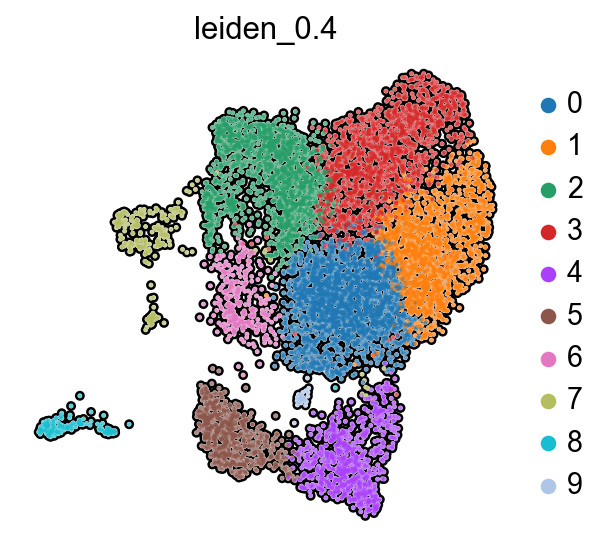

In [449]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    rna, 
    color=['leiden_0.4'], 
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [450]:
rna

AnnData object with n_obs × n_vars = 8792 × 36498
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'leiden_0.4'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'norm_counts', 'Norm-log data'
    obsp: 'distances', 'connectivities'

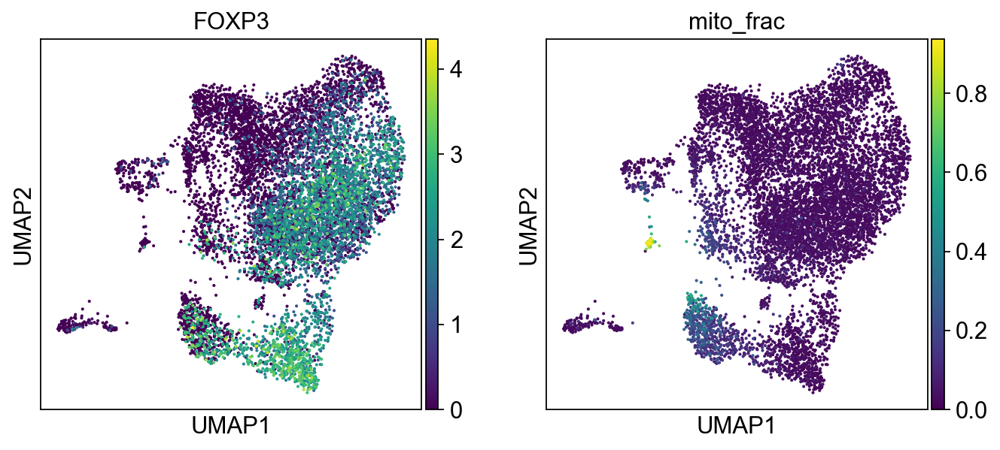

In [451]:
sc.pl.umap(
    rna, 
    color=['FOXP3','mito_frac'])
  

In [452]:
clusters_to_remove = ["5","6", "7","8","9"]
cluster_filter = [x not in clusters_to_remove for x in rna.obs['leiden_0.4']]
print('Total number of cells pre-filtering: ' + str(rna.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
rna = rna[cluster_filter]

Total number of cells pre-filtering: 8792
Number of cells to keep after filtering: 7453


/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


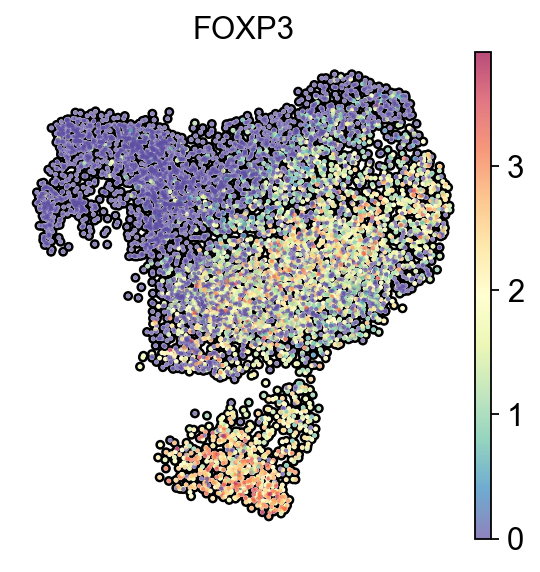

In [453]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    rna, 
    color=['FOXP3'], 
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [454]:
#mu.pp.filter_obs(rna, obsnames2)


In [455]:
sc.pp.highly_variable_genes(rna, n_top_genes=3000, n_bins=20, flavor='seurat_v3')

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:61: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}


In [456]:
print("Highly variable genes: %d"%sum(rna.var.highly_variable))


Highly variable genes: 3000


In [457]:
rng = np.random.RandomState(42)
sc.tl.pca(rna, n_comps=60,  svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [458]:
sc.pp.neighbors(rna, n_neighbors=15,n_pcs = 30, random_state=42)

In [459]:
sc.tl.umap(rna, min_dist=0.2)

In [460]:
Treg: ['Foxp3', 'Tnfrsf4', 'Izumo1r', 'Ctla4', 'Ikzf2', 'Ikzf4', 'Tff1',
       'IFI27l2A', 'Lrig1', 'Cd3d', 'Tox', 'Nrp1', 'Rora', 'Sntb1', 'Frmd5',
       'Tnfrsf9', 'Itgav', 'Cd2', 'Trbc2', 'Prkca', 'Ltb', 'Shisa5', 'Trac',
       'Tnfrsf18', 'Malat1', 'Tmsb4x', 'Cd3g', 'Fth1', 'Eef1a1', 'Areg',
       'Adamts6', 'Ccr6', 'Il2ra', 'Il1r2', 'Apol9b', 'Fam169b', 'Cd5',
       'Inpp4b', 'Bmyc', 'Tmsb10']

In [461]:
sc.tl.score_genes(rna, gene_list = ['FOXP3', 'TNFRSF4', 'CTLA4', 'IKZF2', 'IKZF4', 
         'CD3D', 'TOX','TNFRSF9', 'CD2', 'TRBC2',  'LTB', 'SHISA5', 'TRAC',
       'TNFRSF18',  'TMSB4X', 'CD3G', 'FTH1',
       'CCR6', 'IL2RA', 'IL1R2','CD5',
       'INPP4B', 'TMSB10'],  score_name='Recirculating Treg Spectra score', use_raw=False)


In [462]:
sc.tl.score_genes(rna, gene_list = ['FOXP3', 'TNFRSF4', 'IZUMO1R', 'CTLA4', 'IKZF2', 'IKZF4', 'TFF1',
       'IFI27l2A', 'LRIG1', 'CD3D', 'TOX', 'NRP1', 'RORA', 'SNTB1', 'FRMD5',
       'TNFRSF9', 'ITGAV', 'CD2', 'TRBC2', 'PRKC', 'LTB', 'SHISA5', 'TRAC',
       'TNFRSF18',  'TMSB4X', 'CD3G', 'Fth1', 'Eef1a1', 'Areg',
       'ADAMTS6', 'CCR6', 'IL2RA', 'IL1R2', 'APOl9B', 'Fam169b', 'Cd5',
       'INPP4B', 'BMYC', 'TMSB10'],  score_name='Treg', use_raw=False)


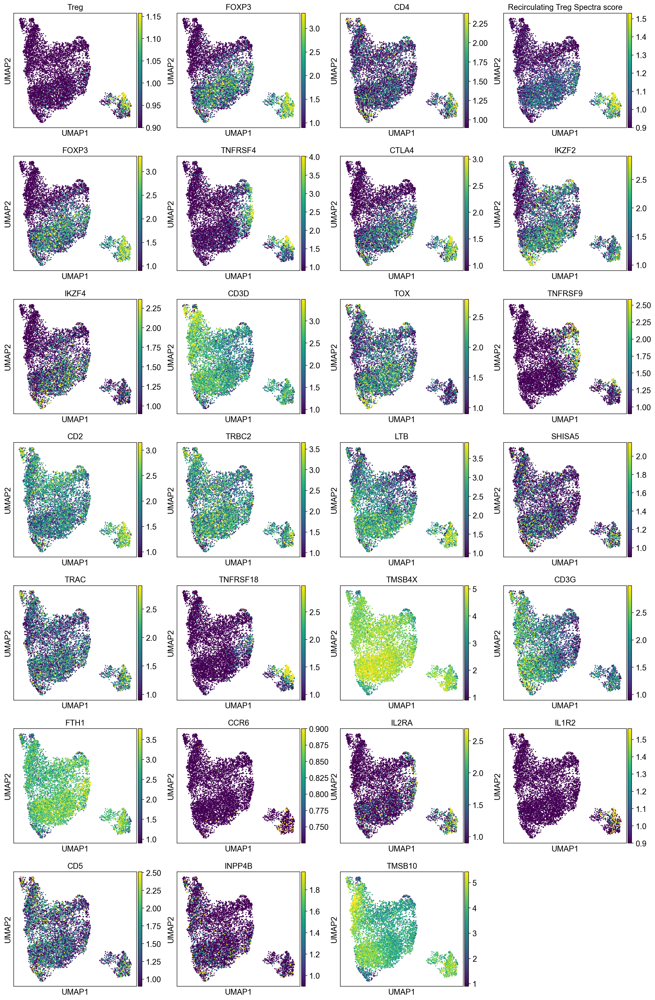

In [463]:
sc.pl.umap(rna, color=["Treg","FOXP3","CD4","Recirculating Treg Spectra score",'FOXP3', 'TNFRSF4', 'CTLA4', 'IKZF2', 'IKZF4', 
         'CD3D', 'TOX','TNFRSF9', 'CD2', 'TRBC2',  'LTB', 'SHISA5', 'TRAC',
       'TNFRSF18',  'TMSB4X', 'CD3G', 'FTH1',
       'CCR6', 'IL2RA', 'IL1R2','CD5',
       'INPP4B', 'TMSB10'], vmin=0.9,vmax="p99")

In [464]:
for resolution_parameter in [0.2, 0.4, 0.6]:
    sc.tl.leiden(rna, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWa

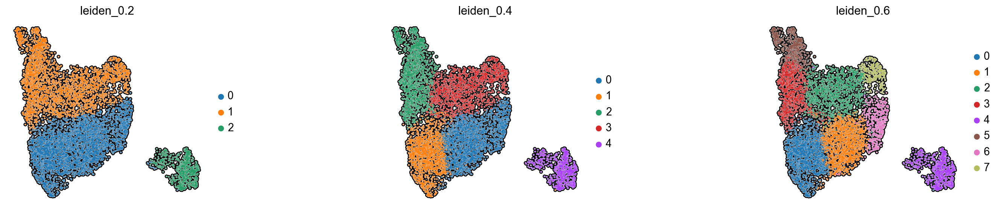

In [465]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    rna, 
    color=['leiden_0.2', 'leiden_0.4', 'leiden_0.6', ], 
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.7,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [466]:
rna.obs['cell_type'] = [  'Recirculating Treg' if (x=='2' ) else
                           'developing Treg' if ( x=='0' )else
                               'SP CD4' for x in rna.obs['leiden_0.2']] 

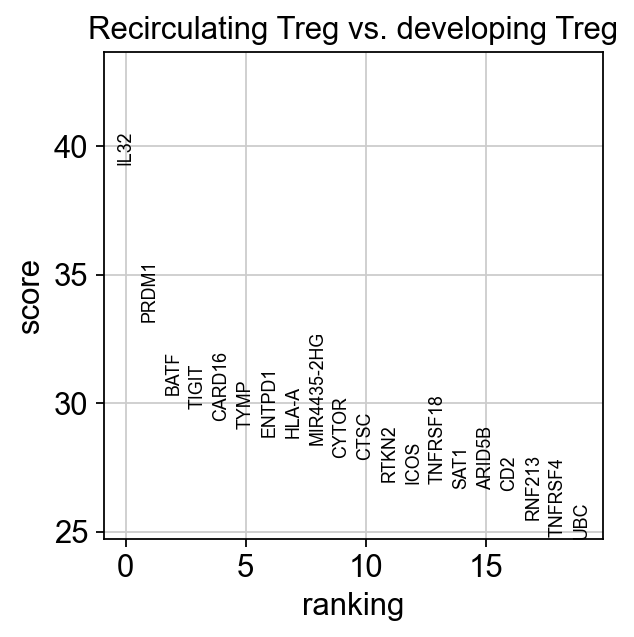

In [467]:
sc.tl.rank_genes_groups(rna, 'cell_type', groups=['Recirculating Treg'], reference='developing Treg', method='wilcoxon')
sc.pl.rank_genes_groups(rna, groups=['Recirculating Treg'], n_genes=20)

In [468]:
categories = ['Recirculating Treg',  'developing Treg','SP CD4']

In [469]:
rna.obs['cell_type'].cat.reorder_categories(categories)



AAACCTGAGAGATGAG-1       developing Treg
AAACCTGAGAGTTGGC-1                SP CD4
AAACCTGAGCTTTGGT-1       developing Treg
AAACCTGAGGTCGGAT-1                SP CD4
AAACCTGAGTGCCATT-1       developing Treg
                             ...        
TTTGTCAGTTAAAGTG-1    Recirculating Treg
TTTGTCATCCTAGAAC-1                SP CD4
TTTGTCATCCTCAACC-1       developing Treg
TTTGTCATCTATCCTA-1       developing Treg
TTTGTCATCTTTCCTC-1                SP CD4
Name: cell_type, Length: 7453, dtype: category
Categories (3, object): ['Recirculating Treg', 'developing Treg', 'SP CD4']

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


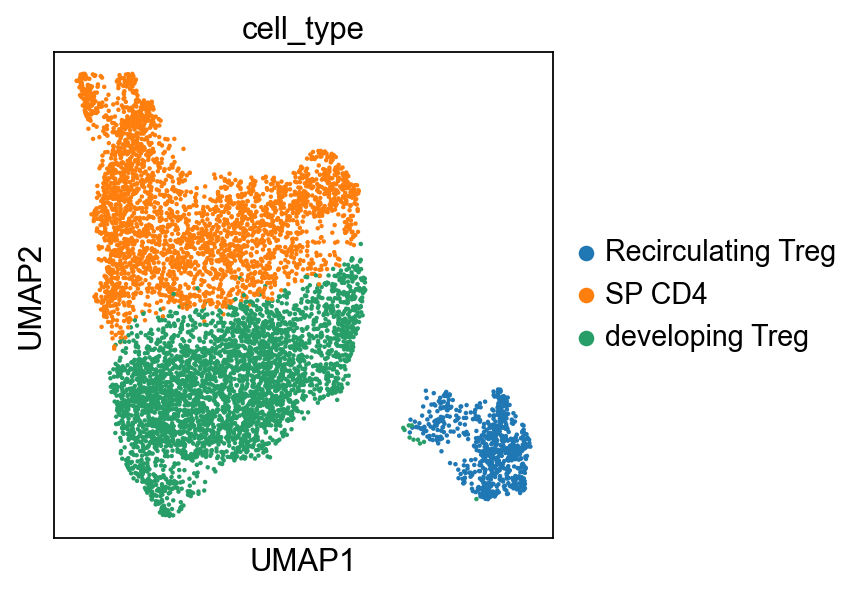

In [471]:
sc.pl.umap(rna,color="cell_type")

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


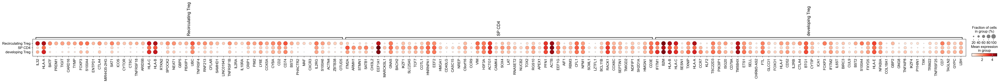

In [473]:
sc.tl.rank_genes_groups(rna, groupby='cell_type', method='wilcoxon',layers='norm_counts')
sc.pl.rank_genes_groups_dotplot(rna, n_genes=50, dendrogram=False)


In [474]:
result = rna.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
for group in groups for key in ['names','logfoldchanges','pvals_adj','pvals',]})
df.to_csv('/Users/xleana/Desktop/Human_Thymus/recirculating.csv')

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


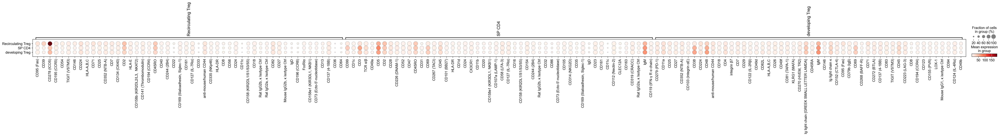

In [521]:
sc.tl.rank_genes_groups(prot, groupby='cell_type', method='wilcoxon',layers='norm_counts')
sc.pl.rank_genes_groups_dotplot(prot, n_genes=50, dendrogram=False)


In [523]:
result = prot.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
for group in groups for key in ['names','logfoldchanges','pvals_adj','pvals',]})
df.to_csv('/Users/xleana/Desktop/Human_Thymus/recirculatingprot.csv')

In [475]:
prot.var['control']= prot.var_names.str.contains('isotype')

In [476]:
sc.pp.calculate_qc_metrics(
    prot, 
    percent_top=(5,10,15),
    var_type='antibodies',
    qc_vars=('control',),
    inplace=True)

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/preprocessing/_qc.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[obs_metrics.columns] = obs_metrics


In [477]:
import seaborn as sns
import matplotlib as mpl

In [478]:
prot.layers['counts']=prot.X.copy()

In [479]:
sc.pp.normalize_total(prot)

In [480]:
sc.pp.neighbors(prot, n_neighbors=30)


In [481]:
for resolution_parameter in [0.2, 0.4, 0.6, 0.8, 1.0]:
    sc.tl.leiden(prot, resolution=resolution_parameter, random_state=42, 
                        key_added='prot_leiden_'+str(resolution_parameter))

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[key_added] = pd.Categorical(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs[key_added] = pd.Categorical(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: SettingWithCopyWarning: 
A value is trying

In [482]:
prot.obsp['protein_connectivities'] = prot.obsp['connectivities'].copy()

In [483]:
rng = np.random.RandomState(42)
sc.tl.pca(prot, n_comps=30,  svd_solver='arpack', random_state=rng, use_highly_variable=False)

In [484]:
sc.pp.neighbors(prot, n_neighbors=20,n_pcs = 30, random_state=42)

In [485]:
sc.tl.umap(prot, min_dist=0.5)

In [486]:
prot.var_names=prot.var['feature_name']

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/anndata/_core/anndata.py:1230: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[key] = c
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


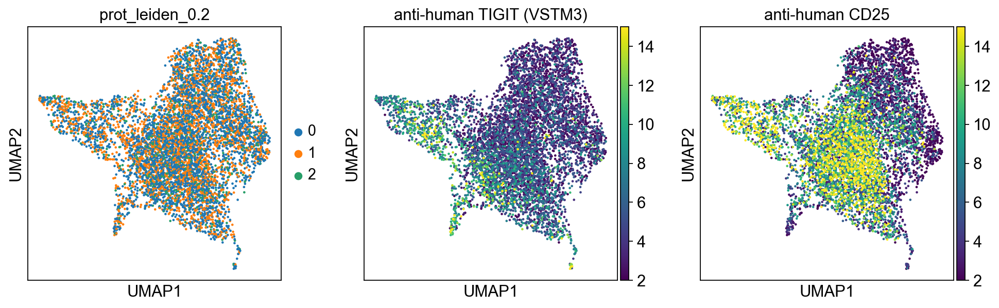

In [487]:
sc.pl.umap(prot,color=['prot_leiden_0.2', 'anti-human TIGIT (VSTM3)','anti-human CD25',],vmin=2,vmax=15)

In [488]:
rna.obs["cell_type"]

AAACCTGAGAGATGAG-1       developing Treg
AAACCTGAGAGTTGGC-1                SP CD4
AAACCTGAGCTTTGGT-1       developing Treg
AAACCTGAGGTCGGAT-1                SP CD4
AAACCTGAGTGCCATT-1       developing Treg
                             ...        
TTTGTCAGTTAAAGTG-1    Recirculating Treg
TTTGTCATCCTAGAAC-1                SP CD4
TTTGTCATCCTCAACC-1       developing Treg
TTTGTCATCTATCCTA-1       developing Treg
TTTGTCATCTTTCCTC-1                SP CD4
Name: cell_type, Length: 7453, dtype: category
Categories (3, object): ['Recirculating Treg', 'SP CD4', 'developing Treg']

In [489]:
mdata = mu.MuData({"rna": rna, 'prot':prot}, )



In [490]:
mdata.update()
mu.pp.intersect_obs(mdata)


In [491]:
mdata

rna:n_genes_by_counts,int32,"2777,2055,1754,1425,1546,1701,2216,1835,1624,807,1..."
rna:log1p_n_genes_by_counts,float64,"7.93,7.63,7.47,7.26,7.34,7.44,7.70,7.52,7.39,6.69,..."
rna:total_counts,float32,"8478.00,5573.00,4454.00,3281.00,3121.00,4014.00,41..."
rna:log1p_total_counts,float32,"9.05,8.63,8.40,8.10,8.05,8.30,8.34,8.46,8.06,7.13,..."
rna:pct_counts_in_top_50_genes,float64,"30.02,32.08,35.68,32.89,28.45,30.94,23.37,34.56,25..."
rna:pct_counts_in_top_100_genes,float64,"41.92,44.97,47.69,44.80,38.26,42.78,30.45,45.98,35..."
rna:pct_counts_in_top_200_genes,float64,"51.97,55.43,57.43,55.96,49.89,53.49,39.09,56.12,46..."
rna:pct_counts_in_top_500_genes,float64,"65.30,69.19,71.76,71.81,66.49,69.66,55.20,70.64,64..."
rna:original_total_counts,float32,"8478.00,5573.00,4454.00,3281.00,3121.00,4014.00,41..."
rna:log10_original_total_counts,float32,"3.93,3.75,3.65,3.52,3.49,3.60,3.62,3.67,3.50,3.10,..."
rna:mito_frac,float32,"0.01,0.02,0.03,0.04,0.04,0.02,0.02,0.03,0.02,0.04,..."


In [492]:
rna

AnnData object with n_obs × n_vars = 6918 × 36498
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'leiden_0.4', 'Recirculating Treg Spectra score', 'Treg', 'leiden_0.2', 'leiden_0.6', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.2_colors', 'leiden_0.6_colors', 'rank_genes_groups', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'norm_counts', 'Norm-log data'
    obsp: 'distanc

In [493]:
prot.obsm=rna.obsm

In [494]:
prot.obs['cell_type']=rna.obs['cell_type']

In [495]:
prot.obsm[ 'X_umap_rna']=rna.obsm['X_umap']

In [496]:
prot

AnnData object with n_obs × n_vars = 6918 × 137
    obs: 'unmapped', 'barcode_sequence', '-1', 'barcode', 'n_antibodies_by_counts', 'log1p_n_antibodies_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_5_antibodies', 'pct_counts_in_top_10_antibodies', 'pct_counts_in_top_15_antibodies', 'total_counts_control', 'log1p_total_counts_control', 'pct_counts_control', 'prot_leiden_0.2', 'prot_leiden_0.4', 'prot_leiden_0.6', 'prot_leiden_0.8', 'prot_leiden_1.0', 'cell_type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'n_counts'
    var: 'feature_name', 'control', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'neighbors', 'leiden', 'pca', 'umap', 'prot_leiden_0.2_colors', 'rank_genes_groups', 'cell_type_colors', 'dendrogram_cell_type'
    obsm: 'X_pca', 'X_umap', 'X_umap_rna'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities', 'protein_connectivities'

In [497]:
prot.var[0:40]

,feature_name,control,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
feature_name,,,,,,,,
anti-human CD86,anti-human CD86,False,2451,0.457271,0.376566,64.570685,3163.404053,8.059720
"anti-human CD274 (B7-H1, PD-L1)","anti-human CD274 (B7-H1, PD-L1)",False,6631,3.750633,1.558278,4.148598,25946.925781,10.163847
"anti-human CD270 (HVEM, TR2)","anti-human CD270 (HVEM, TR2)",False,6913,9.346823,2.336679,0.072275,64661.253906,11.076933
anti-human CD155 (PVR),anti-human CD155 (PVR),False,5648,1.698117,0.992554,18.357907,11747.591797,9.371489
anti-human CD112 (Nectin-2),anti-human CD112 (Nectin-2),False,6780,4.459373,1.697334,1.994796,30849.982422,10.336924
anti-human CD47,anti-human CD47,False,6887,9.301865,2.332325,0.448106,64350.265625,11.072112
anti-human CD48,anti-human CD48,False,6916,57.297325,4.065556,0.028910,396382.718750,12.890138
anti-human CD40,anti-human CD40,False,4870,1.256989,0.814031,29.603932,8695.836914,9.070715
anti-human CD154,anti-human CD154,False,6896,6.494311,2.014144,0.318011,44927.707031,10.712832


In [498]:
import re


In [499]:
new_var_names = []

for name in prot.var_names:
    # Remove "anti-human" prefix
    name = re.sub(r'^anti-human\s+', '', name)

    # Extract protein name within parentheses
    match = re.search(r'\((.*?)\)', name)
    if match:
        protein_name = match.group(1)
        name = name.replace(f'({protein_name})', f'({protein_name.strip()})').strip()
    
    new_var_names.append(name)

prot.var_names = new_var_names


In [500]:
sc.tl.rank_genes_groups(prot, groupby='cell_type', method='wilcoxon')


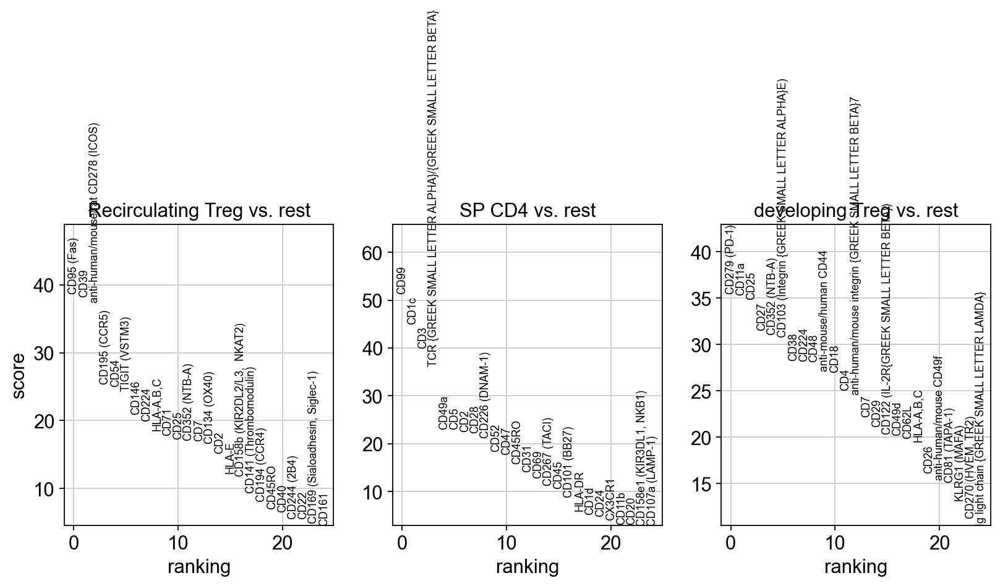

In [501]:
sc.pl.rank_genes_groups(prot, n_genes=25, sharey=False)


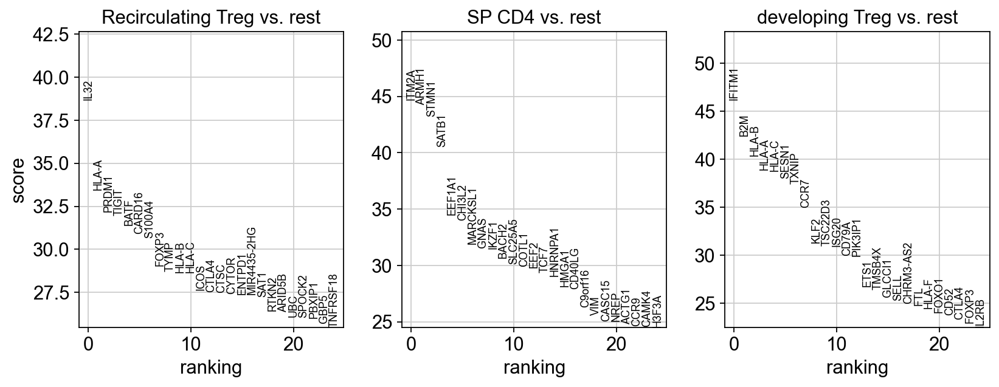

In [502]:
sc.tl.rank_genes_groups(rna, groupby='cell_type', method='wilcoxon')


sc.pl.rank_genes_groups(rna, n_genes=25, sharey=False)


In [503]:
prot.uns['rank_genes_groups']

{'params': {'groupby': 'cell_type',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': False,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('CD95 (Fas)', 'CD99', 'CD279 (PD-1)'),
            ('CD39', 'CD1c', 'CD11a'),
            ('anti-human/mouse/rat CD278 (ICOS)', 'CD3', 'CD25'),
            ('CD195 (CCR5)', 'TCR {GREEK SMALL LETTER ALPHA}/{GREEK SMALL LETTER BETA}', 'CD27'),
            ('CD54', 'CD49a', 'CD352 (NTB-A)'),
            ('TIGIT (VSTM3)', 'CD5', 'CD103 (Integrin {GREEK SMALL LETTER ALPHA}E)'),
            ('CD146', 'CD2', 'CD38'), ('CD224', 'CD28', 'CD224'),
            ('HLA-A,B,C', 'CD226 (DNAM-1)', 'CD48'),
            ('CD71', 'CD52', 'anti-mouse/human CD44'),
            ('CD25', 'CD47', 'CD18'), ('CD352 (NTB-A)', 'CD45RO', 'CD4'),
            ('CD7', 'CD31', 'anti-human/mouse integrin {GREEK SMALL LETTER BETA}7'),
            ('CD134 (OX40)', 'CD69', 'CD7'),
            ('CD2', 'CD267 (TACI)', 'CD29'),
            ('HLA-E

In [504]:
import anndata
import re

# Assuming you have already loaded your 'prot' object

# Check the current column names in prot.var
print(prot.var_names)

# Define a function to clean up variable names
def clean_up_variable_name(name):
    # Remove "anti-human/mouse" or "anti-human/mouse/rat" prefixes
    name = re.sub(r'^anti-human/mouse(/rat)?\s+', '', name)

    # Replace {GREEK SMALL LETTER KAPPA} with kappa sign
    name = name.replace("{GREEK SMALL LETTER KAPPA}", "κ")

    # Replace {GREEK SMALL LETTER ALPHA} with alpha sign
    name = name.replace("{GREEK SMALL LETTER ALPHA}", "α")

    # Replace {GREEK SMALL LETTER BETA} with beta sign
    name = name.replace("{GREEK SMALL LETTER BETA}", "β")

    # Replace {GREEK SMALL LETTER DELTA} with delta sign
    name = name.replace("{GREEK SMALL LETTER DELTA}", "δ")
    
    # Replace {GREEK SMALL LETTER GAMMA} with delta sign
    name = name.replace("{GREEK SMALL LETTER GAMMA}", "γ")

        # Replace {GREEK SMALL LETTER EPSILON} with EPSILON sign
    name = name.replace("{GREEK SMALL LETTER EPSILON}", "ε")

    return name

# Clean up all variable names in prot.var and create a new list
cleaned_var_names = [clean_up_variable_name(var_name) for var_name in prot.var_names]

# Assign the new list of cleaned variable names to prot.var_names
prot.var_names = cleaned_var_names

# Check the column names again to verify the changes
print(prot.var_names)


Index(['CD86', 'CD274 (B7-H1, PD-L1)', 'CD270 (HVEM, TR2)', 'CD155 (PVR)',
       'CD112 (Nectin-2)', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52',
       ...
       'CD85j (ILT2)', 'CD23', 'Ig light chain {GREEK SMALL LETTER LAMDA}',
       'CD328 (Siglec-7)', 'GPR56', 'HLA-E', 'CD82', 'CD101 (BB27)',
       'CD88 (C5aR)', 'CD224'],
      dtype='object', length=137)
Index(['CD86', 'CD274 (B7-H1, PD-L1)', 'CD270 (HVEM, TR2)', 'CD155 (PVR)',
       'CD112 (Nectin-2)', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52',
       ...
       'CD85j (ILT2)', 'CD23', 'Ig light chain {GREEK SMALL LETTER LAMDA}',
       'CD328 (Siglec-7)', 'GPR56', 'HLA-E', 'CD82', 'CD101 (BB27)',
       'CD88 (C5aR)', 'CD224'],
      dtype='object', length=137)


In [505]:
prot.var


,feature_name,control,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
CD86,anti-human CD86,False,2451,0.457271,0.376566,64.570685,3163.404053,8.059720
"CD274 (B7-H1, PD-L1)","anti-human CD274 (B7-H1, PD-L1)",False,6631,3.750633,1.558278,4.148598,25946.925781,10.163847
"CD270 (HVEM, TR2)","anti-human CD270 (HVEM, TR2)",False,6913,9.346823,2.336679,0.072275,64661.253906,11.076933
CD155 (PVR),anti-human CD155 (PVR),False,5648,1.698117,0.992554,18.357907,11747.591797,9.371489
CD112 (Nectin-2),anti-human CD112 (Nectin-2),False,6780,4.459373,1.697334,1.994796,30849.982422,10.336924
CD47,anti-human CD47,False,6887,9.301865,2.332325,0.448106,64350.265625,11.072112
CD48,anti-human CD48,False,6916,57.297325,4.065556,0.028910,396382.718750,12.890138
CD40,anti-human CD40,False,4870,1.256989,0.814031,29.603932,8695.836914,9.070715
CD154,anti-human CD154,False,6896,6.494311,2.014144,0.318011,44927.707031,10.712832
CD52,anti-human CD52,False,6761,5.106678,1.809383,2.269442,35328.019531,10.472460


In [506]:
prot.var

,feature_name,control,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
CD86,anti-human CD86,False,2451,0.457271,0.376566,64.570685,3163.404053,8.059720
"CD274 (B7-H1, PD-L1)","anti-human CD274 (B7-H1, PD-L1)",False,6631,3.750633,1.558278,4.148598,25946.925781,10.163847
"CD270 (HVEM, TR2)","anti-human CD270 (HVEM, TR2)",False,6913,9.346823,2.336679,0.072275,64661.253906,11.076933
CD155 (PVR),anti-human CD155 (PVR),False,5648,1.698117,0.992554,18.357907,11747.591797,9.371489
CD112 (Nectin-2),anti-human CD112 (Nectin-2),False,6780,4.459373,1.697334,1.994796,30849.982422,10.336924
CD47,anti-human CD47,False,6887,9.301865,2.332325,0.448106,64350.265625,11.072112
CD48,anti-human CD48,False,6916,57.297325,4.065556,0.028910,396382.718750,12.890138
CD40,anti-human CD40,False,4870,1.256989,0.814031,29.603932,8695.836914,9.070715
CD154,anti-human CD154,False,6896,6.494311,2.014144,0.318011,44927.707031,10.712832
CD52,anti-human CD52,False,6761,5.106678,1.809383,2.269442,35328.019531,10.472460


In [507]:
prot.obs['cell_type'].cat.reorder_categories(categories)


barcode
CGGAGTCGTCTCCCTA-1       developing Treg
TGAGGGAGTAAATGTG-1                SP CD4
CGAGCCAGTAAATACG-1    Recirculating Treg
TATCTCACAATAGCAA-1                SP CD4
ATGGGAGAGCTAGTGG-1                SP CD4
                             ...        
TCAATCTCACTCTGTC-1       developing Treg
TTGAACGAGACCTAGG-1                SP CD4
GTGCATAGTCAGGACA-1                SP CD4
ACGGAGAGTACAAGTA-1       developing Treg
CGAGCCACAGCCTTTC-1       developing Treg
Name: cell_type, Length: 6918, dtype: category
Categories (3, object): ['Recirculating Treg', 'developing Treg', 'SP CD4']

In [508]:
sc.pp.calculate_qc_metrics(mdata["prot"], inplace=True, percent_top=None)

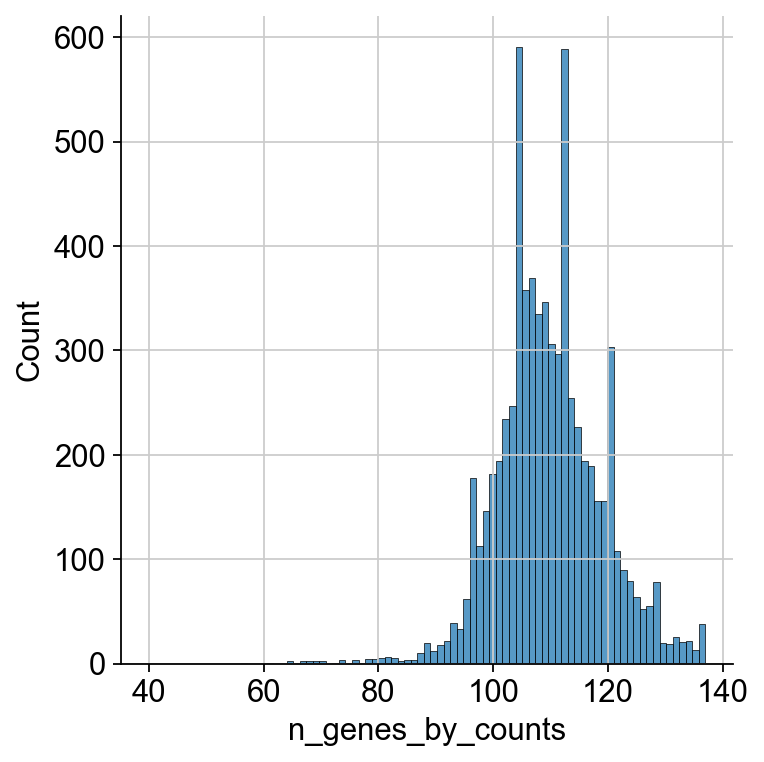

In [509]:
sns.displot(mdata["prot"].obs.n_genes_by_counts)


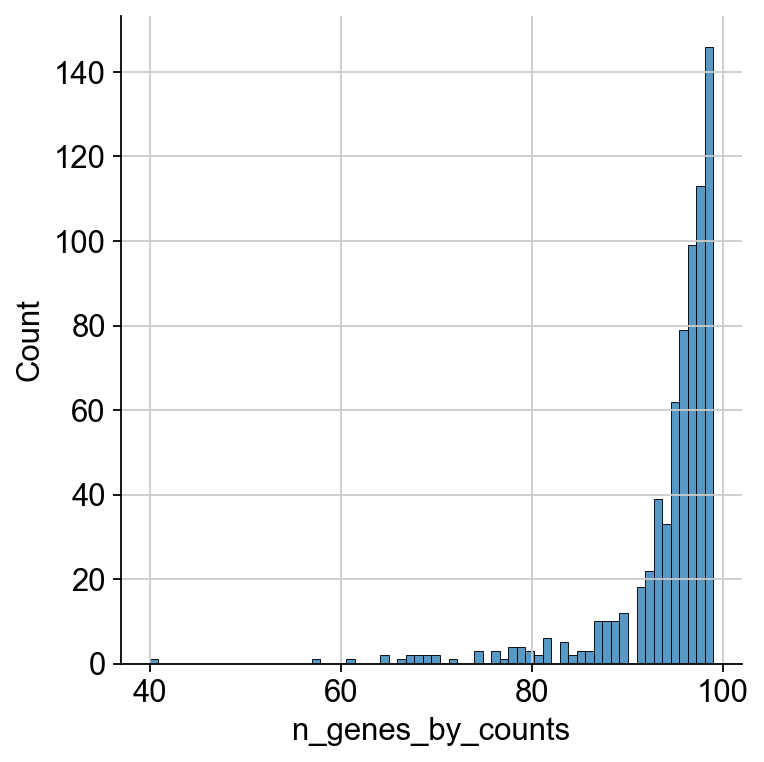

In [510]:
sns.displot(
    mdata["prot"][mdata["prot"].obs.n_genes_by_counts < 100].obs.n_genes_by_counts
)

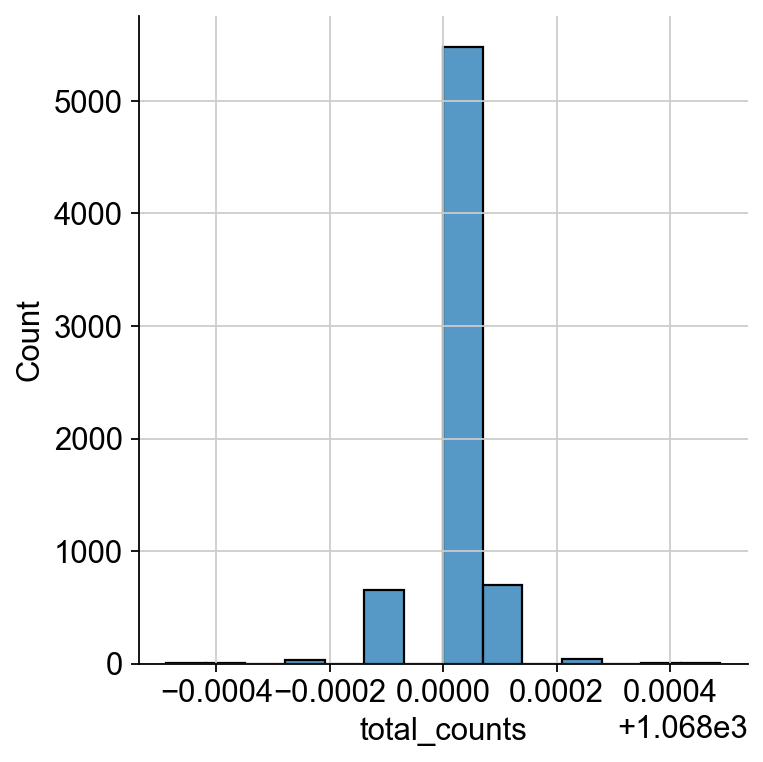

In [511]:
sns.displot(mdata["prot"].obs.total_counts)


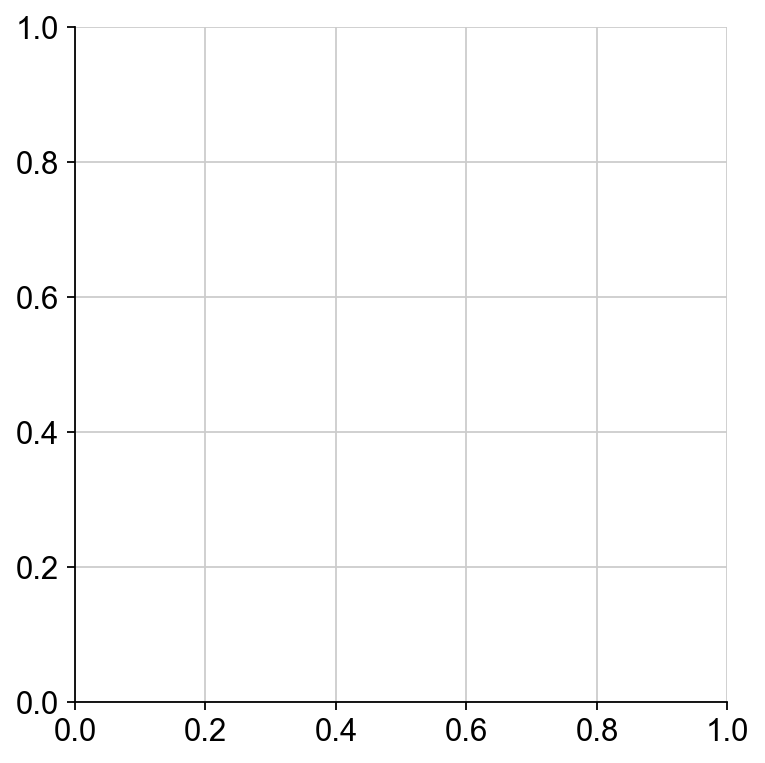

In [512]:
sns.displot(
    mdata["prot"].obs.query("total_counts>20000 and total_counts<100000").total_counts
)

In [513]:
sc.pp.filter_cells(mdata["prot"], max_counts=100000)


<Axes: xlabel='prot_leiden_0.2', ylabel='total_counts'>

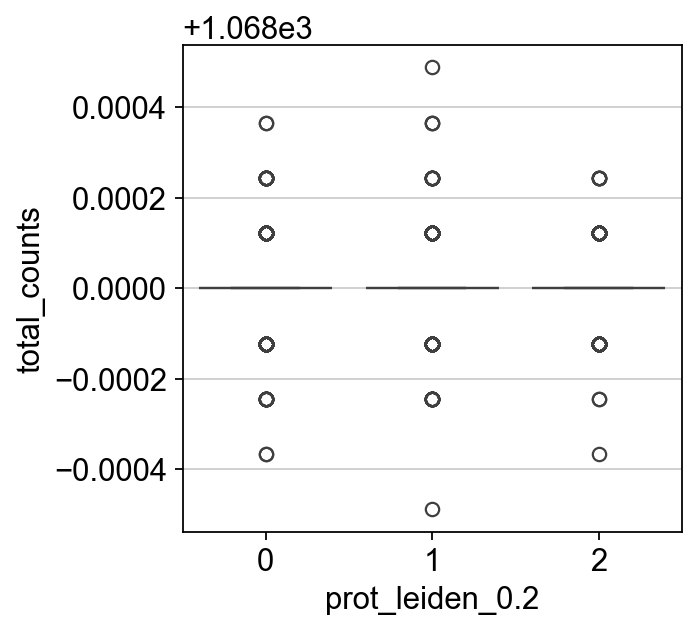

In [514]:
sns.boxplot(y=mdata["prot"].obs.total_counts, x=mdata["prot"].obs['prot_leiden_0.2'])


In [515]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [516]:
outliers = []
for sample in np.unique(mdata["prot"].obs['prot_leiden_0.2']):
    adata_temp = mdata["prot"][mdata["prot"].obs['prot_leiden_0.2'] == sample].copy()
    adata_temp.obs["outlier"] = is_outlier(
        adata_temp, "log1p_total_counts", 5
    ) | is_outlier(adata_temp, "log1p_n_genes_by_counts", 5)
    outliers.append(adata_temp.obs["outlier"])
    print(f"{sample}: outliers {adata_temp.obs.outlier.value_counts()[True]}")

NameError: name 'median_abs_deviation' is not defined

In [ ]:
sns.boxplot(y=mdata["prot"].obs.total_counts, x=mdata["prot"].obs["prot_leiden_0.2"])


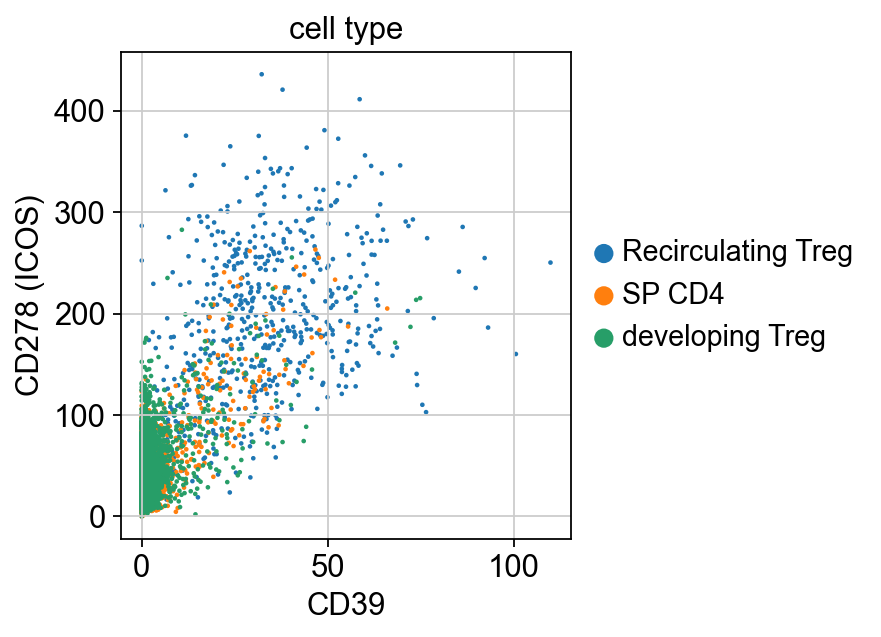

In [517]:
ax= sc.pl.scatter(prot, x='CD39', y='CD278 (ICOS)', color='cell_type', )

In [ ]:
ax= sc.pl.scatter(prot, x='CD39', y='CD278 (ICOS)', color='cell_type',show=False )
ax.set_ylim(0,500)

In [ ]:
ax= sc.pl.scatter(prot, x='CD39', y='TIGIT (VSTM3)', color='cell_type',show=False )
ax.set_ylim(0,30)
ax.set_xlim(0,80)


In [ ]:
ax= sc.pl.scatter(rna, x='ENTPD1', y='TIGIT', color='cell_type')


In [ ]:
prot.var

In [518]:
sc.tl.rank_genes_groups(prot, groupby='cell_type', method='wilcoxon')


/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


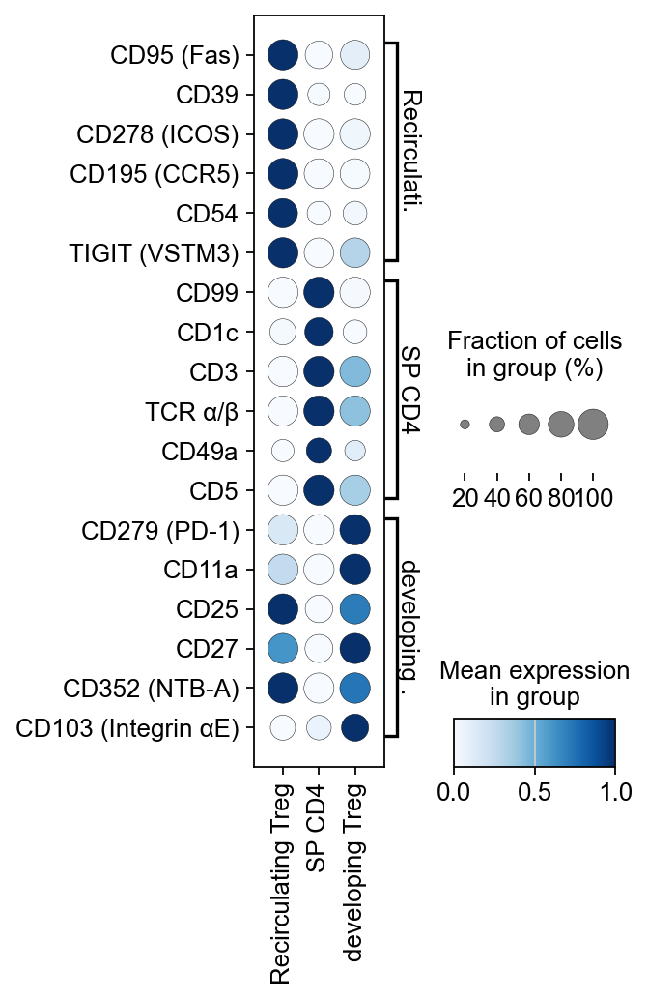

In [519]:
sc.pl.rank_genes_groups_dotplot(prot, n_genes=6,dendrogram=False, standard_scale="var",swap_axes=True,figsize =[3.,6],cmap='Blues')


/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


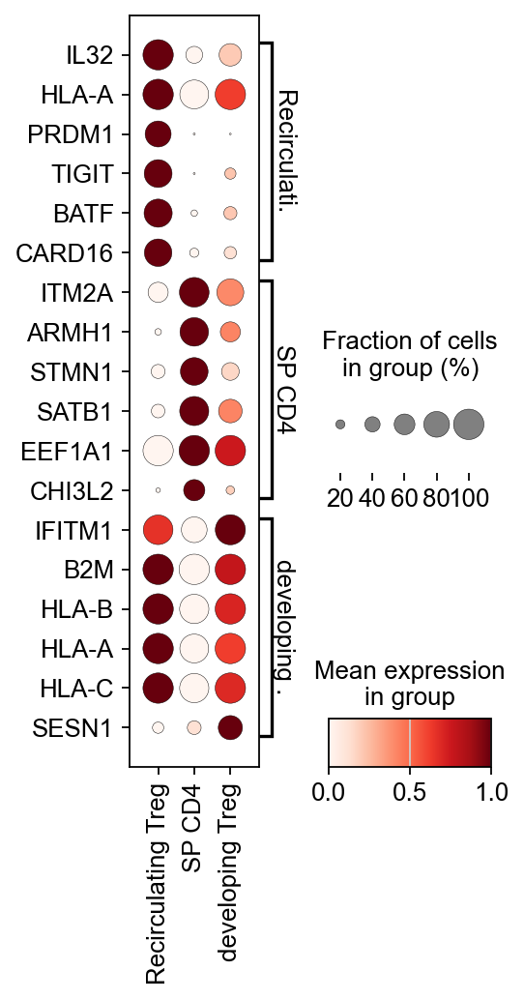

In [520]:
sc.pl.rank_genes_groups_dotplot(rna, n_genes=6,dendrogram=False, standard_scale="var",swap_axes=True,figsize =[3.,6])


In [186]:
import magic

In [187]:
magic_op = magic.MAGIC()

In [188]:
magic_op.set_params(knn=5, t=4)

MAGIC(knn_max=15, t=4)

In [189]:
adataCD4_magic = magic_op.fit_transform(rna, genes=[['TIGIT', 'ENTPD1', 'ICOS']])


Calculating MAGIC...
  Running MAGIC on 7436 cells and 36498 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...


/Users/xleana/.local/lib/python3.8/site-packages/magic/magic.py:425: UserWarning: Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.
  warnings.warn(


    Calculated PCA in 8.62 seconds.
    Calculating KNN search...
    Calculated KNN search in 10.76 seconds.
    Calculating affinities...
    Calculated affinities in 5.54 seconds.
  Calculated graph and diffusion operator in 24.94 seconds.
  Calculating imputation...
Calculated MAGIC in 25.09 seconds.


In [190]:
adataCD4_magic

AnnData object with n_obs × n_vars = 7436 × 3
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'leiden_0.4', 'Recirculating Treg Spectra score', 'Treg', 'leiden_0.2', 'leiden_0.6', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'

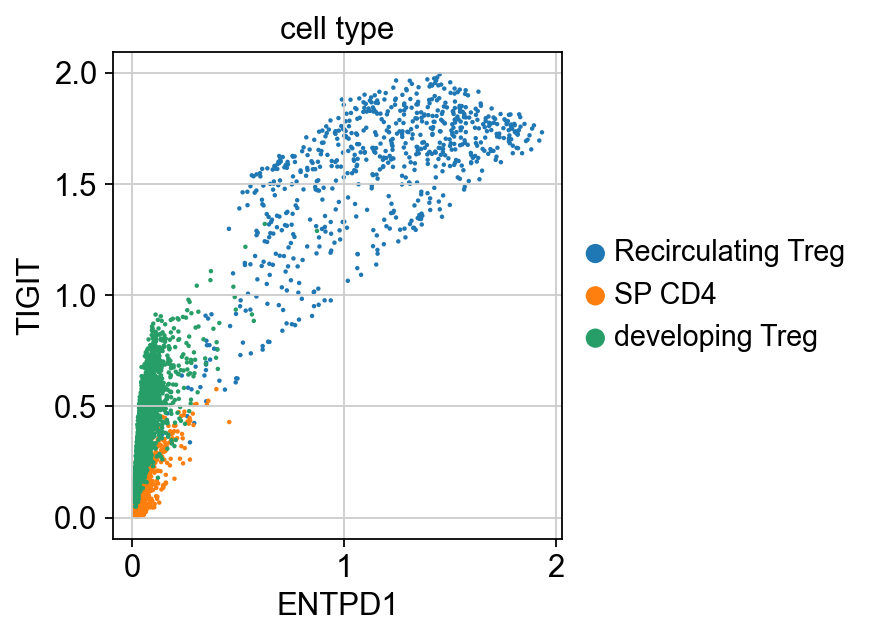

In [191]:
ax= sc.pl.scatter(adataCD4_magic, x='ENTPD1', y='TIGIT', color='cell_type')


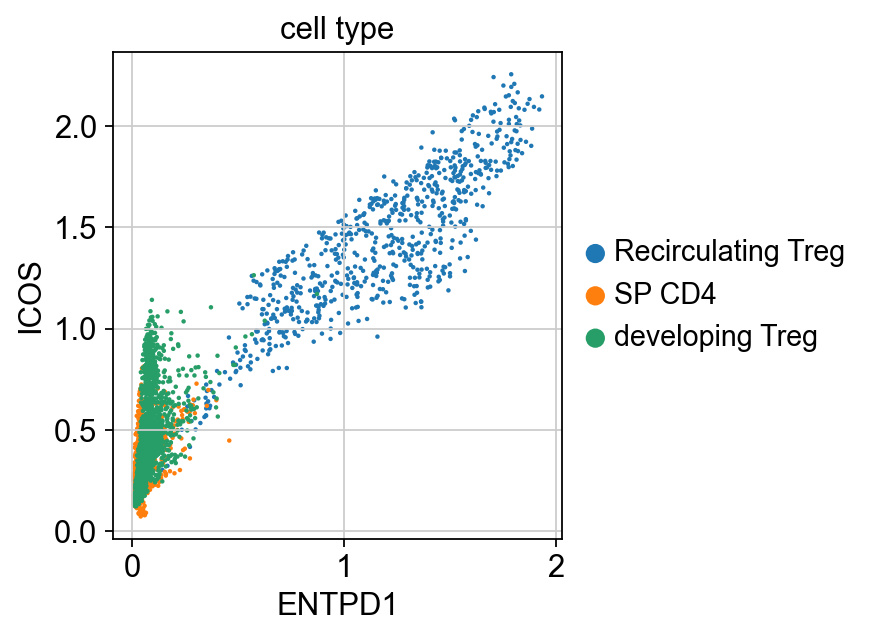

In [192]:
ax= sc.pl.scatter(adataCD4_magic, x='ENTPD1', y='ICOS', color='cell_type')


In [194]:
import scprep


In [195]:
prot.obs["cell_type"]

barcode
CGGAGTCGTCTCCCTA-1       developing Treg
TGAGGGAGTAAATGTG-1                SP CD4
CGAGCCAGTAAATACG-1    Recirculating Treg
TATCTCACAATAGCAA-1                SP CD4
ATGGGAGAGCTAGTGG-1                SP CD4
                             ...        
GTGCATAGTCAGGACA-1                SP CD4
ACGGAGAGTACAAGTA-1       developing Treg
CGAGCCACAGCCTTTC-1       developing Treg
CGCTTCACAAAGTGCG-1       developing Treg
GTTAAGCGTCCTGCTT-1                SP CD4
Name: cell_type, Length: 7436, dtype: category
Categories (3, object): ['Recirculating Treg', 'SP CD4', 'developing Treg']

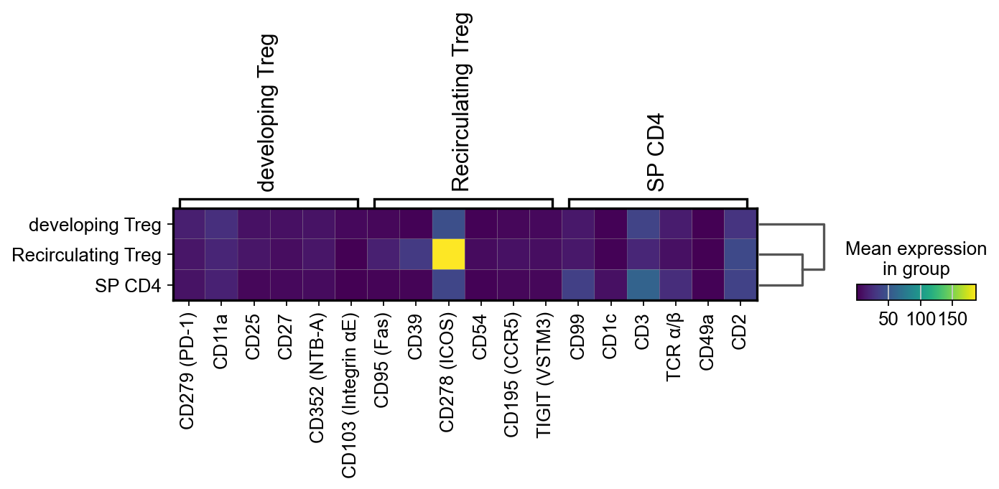

In [196]:
sc.pl.rank_genes_groups_matrixplot(prot, n_genes=6)


In [197]:
mdata = mu.MuData({"rna": rna, 'prot':prot}, )



/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


In [198]:
sc.pp.neighbors(prot, n_neighbors=30)


In [325]:
adata_tcr= sc.read("/Users/xleana/Desktop/Human_Thymus/CR-vdj-results/TCR_01_preprocessed.h5ad")

/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


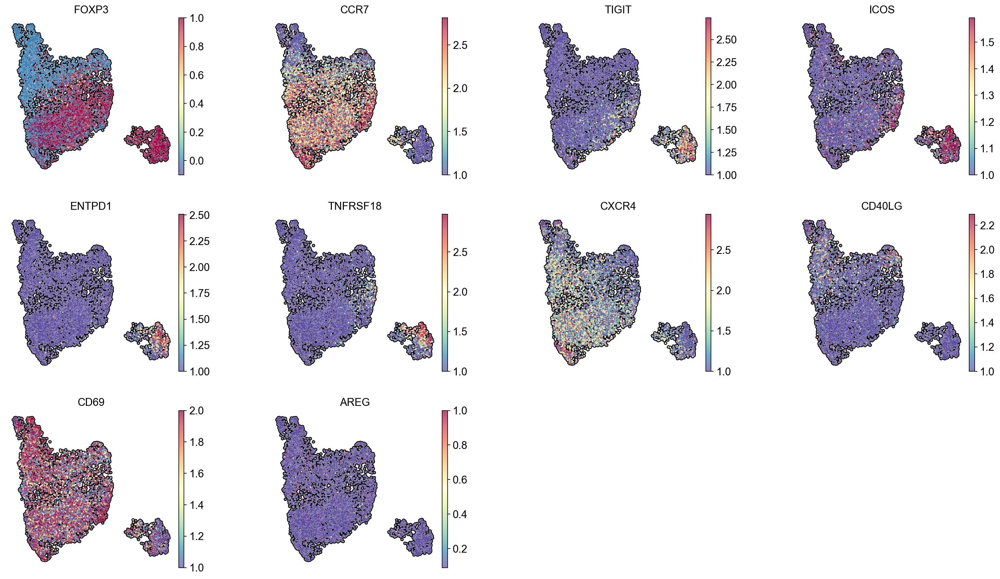

In [200]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    rna, 
    color=["FOXP3","CCR7","TIGIT","ICOS","ENTPD1","TNFRSF18","CXCR4","CD40LG","CD69","AREG"], 
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.4,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmin=1.0,vmax=[0,"p90","p99","p90","p99","p99","p99","p99","2","0.1"]
)

In [326]:
common_cells = adata_tcr.obs_names.intersection(rna.obs_names)

# Filter adata_tcr to keep only the common cells
adata_tcr = adata_tcr[common_cells, :]

# Now, assign cell types from rna to adata_tcr
adata_tcr.obs['cell_type'] = rna.obs['cell_type']

/var/folders/0x/13ftp0x52zq9gl9dyn4c708r0000gp/T/ipykernel_72852/1002622362.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_tcr.obs['cell_type'] = rna.obs['cell_type']
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [327]:
adata_tcr.obs['cell_type']=rna.obs['cell_type']

In [328]:
rna

AnnData object with n_obs × n_vars = 7436 × 36498
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'leiden_0.4', 'Recirculating Treg Spectra score', 'Treg', 'leiden_0.2', 'leiden_0.6', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.4_colors', 'leiden_0.2_colors', 'leiden_0.6_colors', 'rank_genes_groups', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'norm_counts', 'Norm-log data'
    obsp: 'distanc

In [329]:
adata_tcr

AnnData object with n_obs × n_vars = 6918 × 0
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'rece

In [330]:
import warnings

warnings.filterwarnings(
    "ignore",
    ".*IProgress not found*",
)
warnings.simplefilter(action="ignore", category=FutureWarning)

import scanpy as sc
import scirpy as ir

import pandas as pd

warnings.simplefilter(action="ignore", category=pd.errors.DtypeWarning)

In [331]:
ir.tl.chain_qc(adata_tcr)


In [332]:
adata_tcr.obs["chain_pairing"].value_counts()


chain_pairing
single pair        4728
orphan VDJ          861
extra VJ            695
extra VDJ           305
two full chains     272
orphan VJ            57
Name: count, dtype: int64

In [397]:
print(f"Amount of all T cells:\t\t\t\t{len(adata_tcr)}")
adata_tcr_tmp = adata_tcr[adata_tcr.obs["chain_pairing"] != "no IR"]
print(f"Amount of T cells with AIR:\t\t\t{len(adata_tcr_tmp)}")

adata_tcr_tmp = adata_tcr_tmp[adata_tcr_tmp.obs["chain_pairing"] != "multi_chain"]
print(f"Amount of T cells without dublets:\t\t{len(adata_tcr_tmp)}")

adata_tcr_tmp = adata_tcr_tmp[
    ~adata_tcr_tmp.obs["chain_pairing"].isin(
        ["two full chains", "extra VJ", "extra VDJ"]
    )
]
print(f"Amount of T cells with unique AIR per cell:\t{len(adata_tcr_tmp)}")

adata_tcr_tmp = adata_tcr_tmp[adata_tcr_tmp.obs["chain_pairing"] == "single pair"]
print(f"Amount of T cells with sinlge complete AIR:\t{len(adata_tcr_tmp)}")

Amount of all T cells:				6918
Amount of T cells with AIR:			6918
Amount of T cells without dublets:		6918
Amount of T cells with unique AIR per cell:	5646
Amount of T cells with sinlge complete AIR:	4728


In [398]:
ir.pp.ir_dist(adata_tcr, sequence="aa")


In [400]:
ir.tl.define_clonotype_clusters(
    adata_tcr, sequence="aa", receptor_arms="all", dual_ir="primary_only"
)

  0%|          | 0/6880 [00:00<?, ?it/s]

In [402]:
ir.tl.clonotype_network(adata_tcr, min_cells=2, sequence="aa")


In [403]:
adata_tcr.obs["cc_aa_identity"] = adata_tcr.obs["cc_aa_identity"].astype("str")


In [404]:
adata_tcr.obs.loc[adata_tcr.obs["cc_aa_identity"] == "0", :].groupby(
    [
        "IR_VJ_1_junction_aa",
        "IR_VDJ_1_junction_aa",
        "receptor_subtype",
    ],
    observed=True,
).size().reset_index(name="n_cells")

,IR_VJ_1_junction_aa,IR_VDJ_1_junction_aa,receptor_subtype,n_cells
0,CIVASGGSNYKLTF,CASSYVAQGFNSPLHF,TRA+TRB,1


In [405]:
adata_tcr.obs["cc_aa_identity"]

cell_id
AAACCTGAGAGATGAG-1       0
AAACCTGAGAGTTGGC-1       1
AAACCTGAGCTTTGGT-1       2
AAACCTGAGGTCGGAT-1       3
AAACCTGAGTGCCATT-1       4
                      ... 
TTTGTCAGTTAAAGTG-1    6875
TTTGTCATCCTAGAAC-1    6876
TTTGTCATCCTCAACC-1    6877
TTTGTCATCTATCCTA-1    6878
TTTGTCATCTTTCCTC-1    6879
Name: cc_aa_identity, Length: 6918, dtype: object

In [406]:
import warnings

warnings.filterwarnings(
    "ignore",
    ".*IProgress not found*",
)
warnings.simplefilter(action="ignore", category=FutureWarning)

from palmotif import compute_motif, svg_logo
import scanpy as sc
import scirpy as ir
import pandas as pd
import numpy as np
import seaborn as sb

warnings.simplefilter(action="ignore", category=pd.errors.DtypeWarning)

AttributeError: 'DataFrame' object has no attribute '_convert'

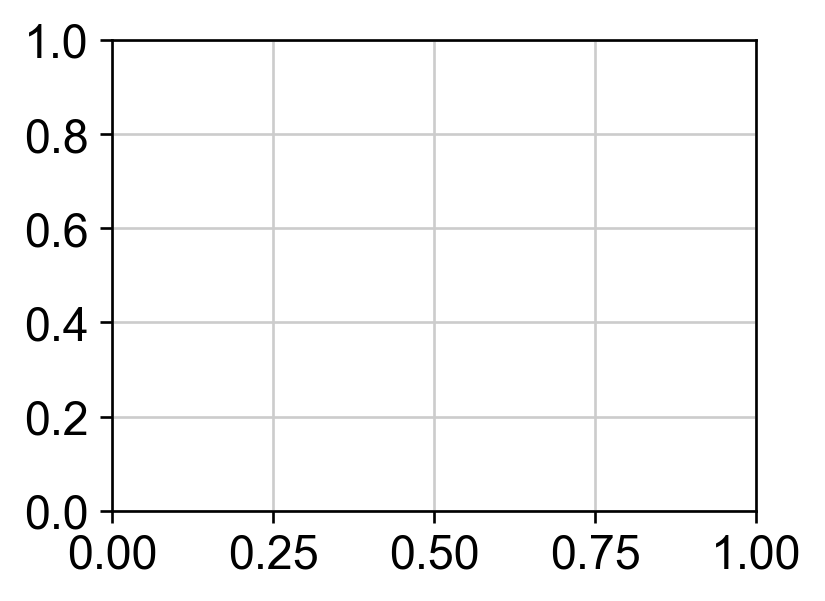

In [407]:

# adata[adata.obs['Status'] == 'Healthy'].obs['patient_id']
_ = ir.pl.group_abundance(
    developingTreg_tcr,
    groupby="cell_type",
    target_col="chain_pairing",
    normalize=True,
    figsize=[10, 10],
)

In [ ]:
adata_tcr.obs

In [278]:
ir.pp.ir_dist(adata_tcr, sequence="aa")


In [279]:
ir.tl.define_clonotype_clusters(
    adata_tcr, sequence="aa", receptor_arms="all", dual_ir="primary_only"
)

  0%|          | 0/7742 [00:00<?, ?it/s]

In [318]:
ir.tl.clonal_expansion(adata, target_col="cc_aa_identity")

_ = ir.pl.clonal_expansion(
    developingTreg_tcr,
    groupby="cell_type",
    target_col="cc_aa_identity",
    clip_at=4,
    normalize=False,
    figsize=[10, 10],
)

ValueError: `target_col` not found in obs.

AttributeError: 'DataFrame' object has no attribute '_convert'

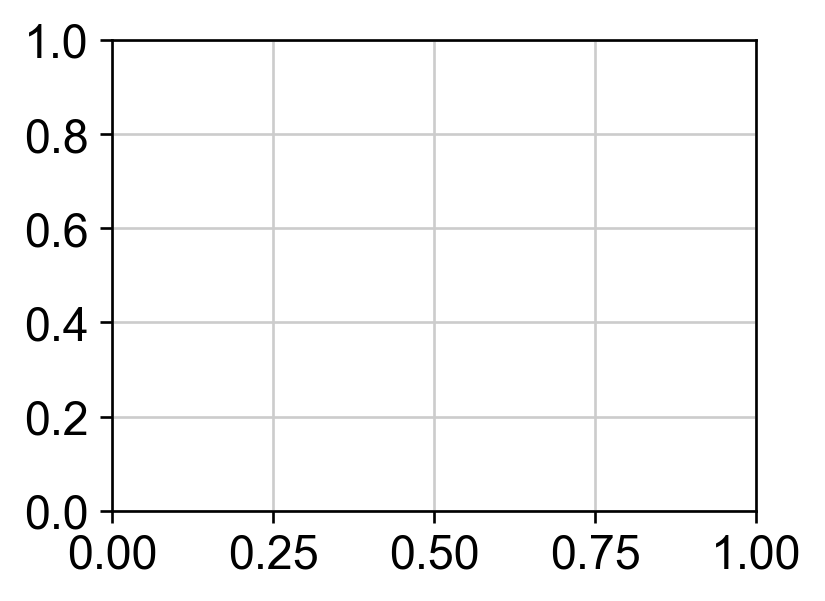

In [255]:
_ = ir.pl.clonal_expansion(
    adata_tcr, "cell_type", target_col="cc_aa_identity", figsize=[2, 2]
)

AttributeError: 'DataFrame' object has no attribute '_convert'

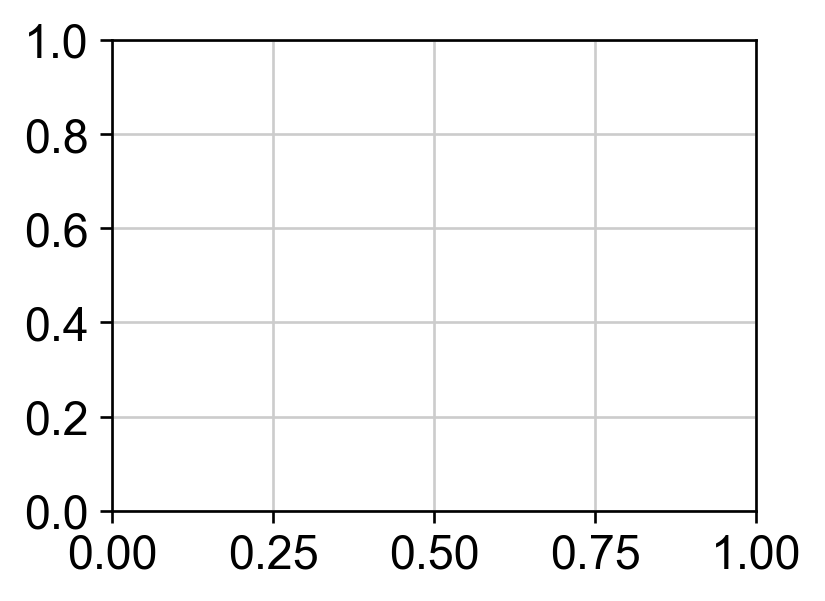

In [256]:
_ = ir.pl.group_abundance(
    adata_tcr,
    groupby="IR_VJ_1_v_call",
    target_col="cell_type",
    normalize=False,
    max_cols=10,
    figsize=[10, 10],
)

# Normalized abundances

_ = ir.pl.group_abundance(
    adata_tcr,
    groupby="IR_VJ_1_v_call",
    target_col="cell_type",
    normalize=True,
    max_cols=10,
    figsize=[10, 10],
)

In [198]:
_ = ir.pl.vdj_usage(
    adata_tcr,
    full_combination=False,
    max_segments=None,
    max_ribbons=30, ax.title=='TCR',
    fig_kws={"figsize": [10, 10]},
)


SyntaxError: positional argument follows keyword argument (561447672.py, line 5)

In [185]:
recirculating_tcr=adata_tcr[adata_tcr.obs['cell_type']=="Recirculating Treg"]

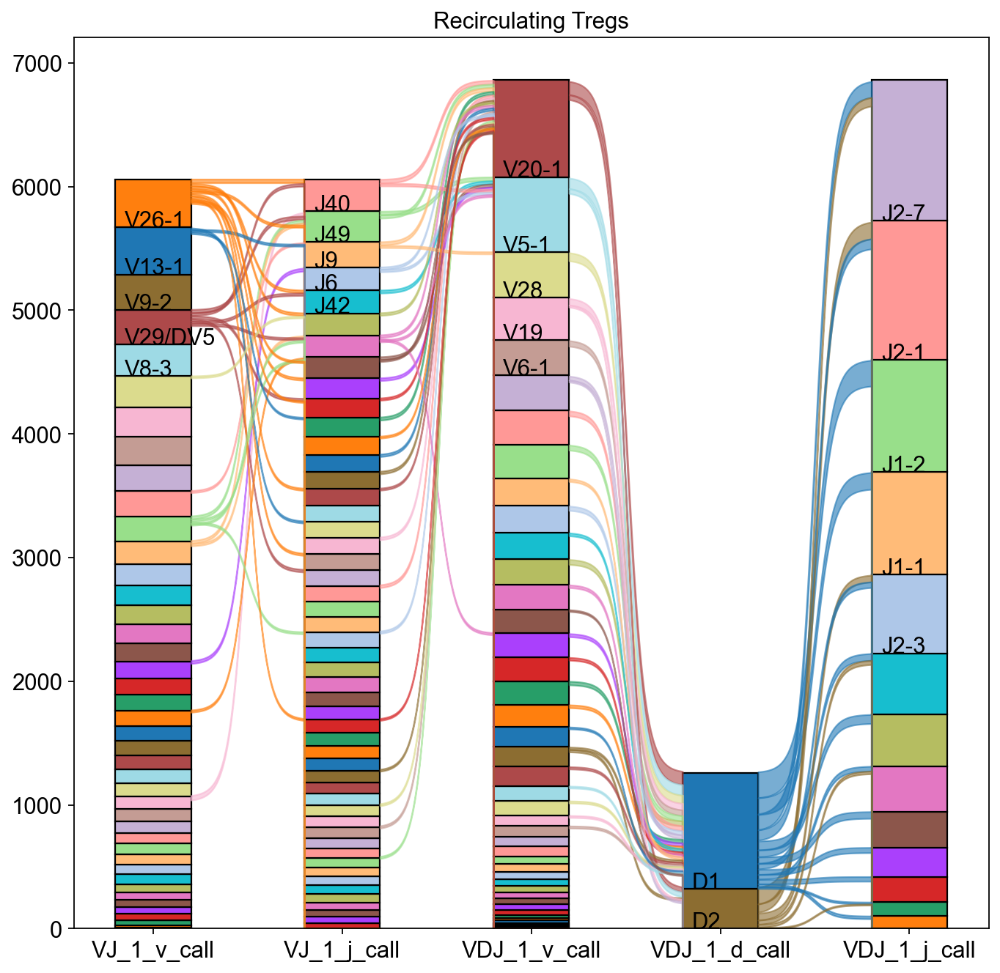

In [321]:
_ = ir.pl.vdj_usage(
    adata_tcr,
    full_combination=False,
    max_segments=None,
    max_ribbons=30,
    fig_kws={"figsize": [10, 10]},
)

plt.title("Recirculating Tregs")
plt.show()

In [315]:
developingTreg_tcr=adata_tcr[adata_tcr.obs['cell_type']=="developing Treg"]

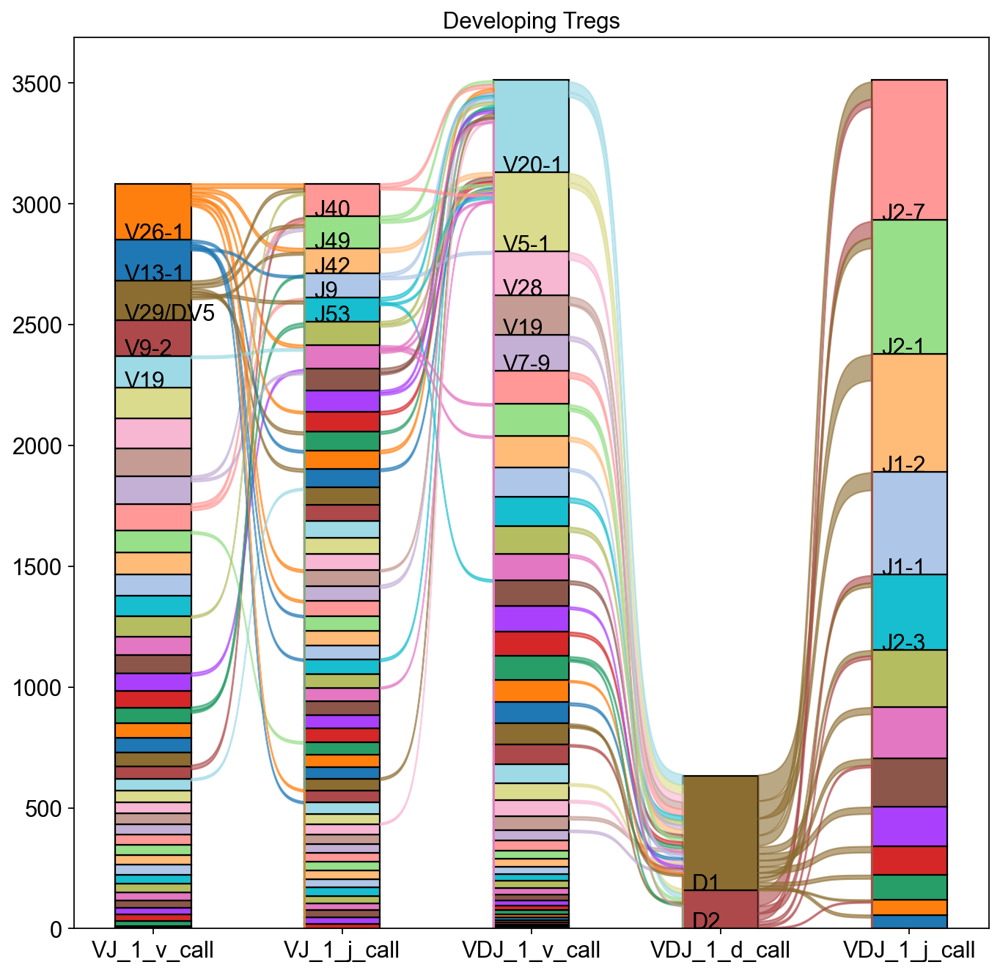

In [316]:
_ = ir.pl.vdj_usage(
    developingTreg_tcr,
    full_combination=False,
    max_segments=None,
    max_ribbons=30,
    fig_kws={"figsize": [10, 10]},
)

plt.title("Developing Tregs")
plt.show()

In [313]:
adata_tcr.obs[adata_tcr.obs["IR_VDJ_1_d_call"] == "TRBD2"].cc_aa_identity.value_counts()


cc_aa_identity
1454    4
214     2
836     2
5132    1
3303    1
       ..
2355    0
2354    0
2353    0
2352    0
6879    0
Name: count, Length: 6880, dtype: int64

AttributeError: 'DataFrame' object has no attribute '_convert'

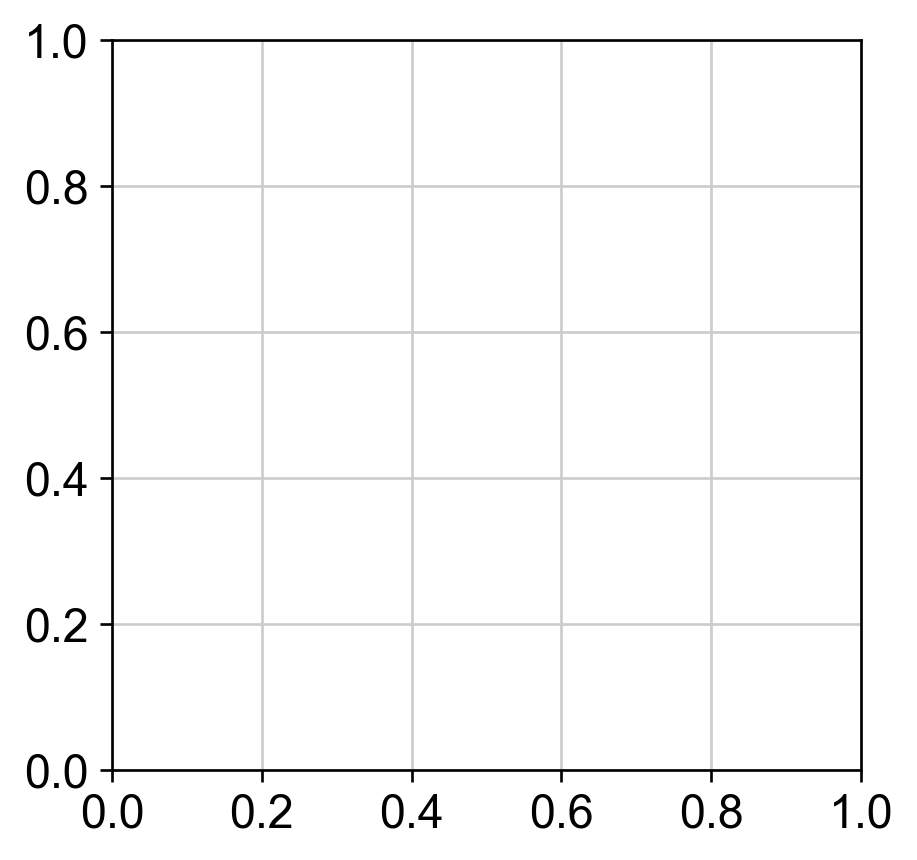

In [322]:
_ = ir.pl.spectratype(
    adata_tcr,
    cdr3_col="IR_VDJ_1_junction_aa",
    color="cell_type",
    viztype="bar",
    fig_kws={"dpi": 120},
    figsize=[10, 10],
)

In [212]:
import warnings

warnings.filterwarnings(
    "ignore",
    ".*IProgress not found*",
)
warnings.simplefilter(action="ignore", category=FutureWarning)

from palmotif import compute_motif, svg_logo
import scanpy as sc
import dandelion as ddl
import scirpy as ir
import pandas as pd
import numpy as np
import seaborn as sb

import os

import matplotlib as mpl
import matplotlib.pyplot as plt

warnings.simplefilter(action="ignore", category=pd.errors.DtypeWarning)

ModuleNotFoundError: No module named 'palmotif'

In [224]:
vdjx = ddl.from_scirpy(adata_tcr)
vdjx

Dandelion class object with n_obs = 7864 and n_contigs = 16107
    data: 'sequence_id', 'sequence', 'rev_comp', 'productive', 'v_call', 'd_call', 'j_call', 'sequence_alignment', 'germline_alignment', 'junction', 'junction_aa', 'v_cigar', 'd_cigar', 'j_cigar', 'c_call', 'consensus_count', 'duplicate_count', 'locus', 'cell_id', 'multi_chain', 'clonal_expansion', 'receptor_type', 'chain_pairing', 'receptor_subtype', 'cc_aa_identity', 'cell_type', 'is_cell', 'high_confidence', 'cc_aa_identity_size', 'rearrangement_status'
    metadata: 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', 'v_call_VDJ_main', '

In [ ]:
df_bcr_raw.head(5)


In [225]:
vdjx.data["v_call"].replace("", np.nan, inplace=True)
vdjx.data.dropna(subset=["v_call"], inplace=True)

vdjx.data["j_call"].replace("", np.nan, inplace=True)
vdjx.data.dropna(subset=["j_call"], inplace=True)

vdjx.data["junction_aa"].replace("", np.nan, inplace=True)
vdjx.data.dropna(subset=["junction_aa"], inplace=True)

vdjx.data["junction_length"] = [len(a) for a in vdjx.data["junction_aa"]]

In [231]:
vdjx

Dandelion class object with n_obs = 7864 and n_contigs = 16107
    data: 'sequence_id', 'sequence', 'rev_comp', 'productive', 'v_call', 'd_call', 'j_call', 'sequence_alignment', 'germline_alignment', 'junction', 'junction_aa', 'v_cigar', 'd_cigar', 'j_cigar', 'c_call', 'consensus_count', 'duplicate_count', 'locus', 'cell_id', 'multi_chain', 'clonal_expansion', 'receptor_type', 'chain_pairing', 'receptor_subtype', 'cc_aa_identity', 'cell_type', 'is_cell', 'high_confidence', 'cc_aa_identity_size', 'rearrangement_status', 'junction_length'
    metadata: 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'v_call_abT_VDJ', 'd_call_abT_VDJ', 'j_call_abT_VDJ', 'v_call_abT_VJ', 'j_call_abT_VJ', 'c_call_abT_VDJ', 'c_call_abT_VJ', 'productive_abT_VDJ', 'productive_abT_VJ', 'duplicate_count_abT_VDJ', 'duplicate_count_abT_VJ', '

In [262]:
ir.pp.merge_with_ir(rna, adata_tcr)


KeyError: 'Could not find key clonal_expansion in .var_names or .obs.columns.'

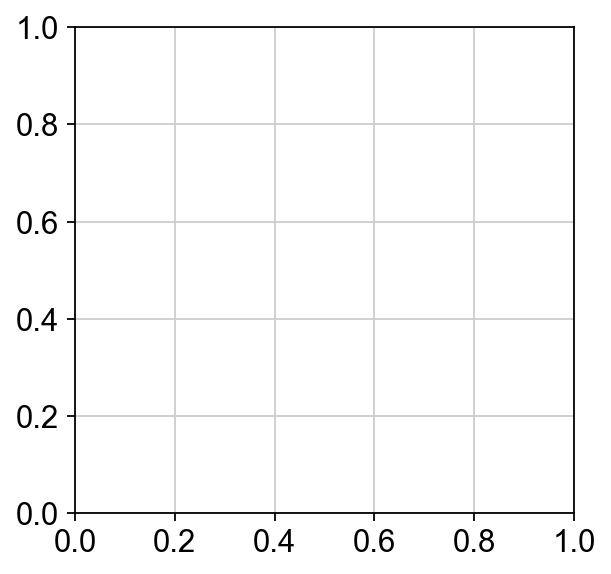

In [211]:
sc.pl.umap(rna, color='clonal_expansion')

In [250]:
ddl.tl.generate_network(
    vdjx, key="sequence_alignment", layout_method="sfdp", clone_key="changeo_clone_id"
)


ValueError: Data does not contain clone information. Please run find_clones.

In [249]:
ddl.tl.transfer(adata_tcr, vdjx, clone_key="changeo_clone_id", expanded_only=True)

edgeweights = [
    1 / (e + 1) for e in ddl.tl.extract_edge_weights(vdjx)
]  # invert and add 1 to each edge weight (e) so that distance of 0 becomes the thickest edge
# therefore, the thicker the line, the shorter the edit distance.

sc.set_figure_params(figsize=[10, 10])
_ = ddl.pl.clone_network(
    adata,
    color=["isotype_status"],
    legend_fontoutline=3,
    edges_width=edgeweights,
    size=50,
)

TypeError: 'NoneType' object is not subscriptable

In [254]:
import rpy2
import os
os.environ['R_HOME'] = '/Library/Frameworks/R.framework/Resources'
os.environ['R_USER'] = '/Library/Frameworks/R.framework/Resources'

In [261]:
import anndata2ri
from rpy2.robjects.packages import importr
import rpy2.robjects as robjects
import magic

ValueError: openrlib.R_HOME cannot be None.

In [259]:
print(rpy2.__version__)

3.5.7


In [240]:
ddl.pp.calculate_threshold(vdjx, model="hh_s5f", plot=False)
vdjx.threshold

ImportError: Unable to initialise R instance. Please run this separately through R with Shazam's tutorial.

In [229]:
ddl.tl.define_clones(vdjx, key_added="changeo_clone_id", model="hh_s5f")


UnboundLocalError: local variable 'contig' referenced before assignment

In [342]:
path_tcr_input = "/Users/xleana/Desktop/Human_Thymus/CR-vdj-results/filtered_contig_annotations.csv"


In [343]:
df_tcr_raw = pd.read_csv(path_tcr_input)


In [344]:
df_tcr_raw

,barcode,is_cell,contig_id,high_confidence,length,chain,v_gene,d_gene,j_gene,c_gene,...,fwr3_nt,cdr3,cdr3_nt,fwr4,fwr4_nt,reads,umis,raw_clonotype_id,raw_consensus_id,exact_subclonotype_id
0,AAACCTGAGAGATGAG-1,True,AAACCTGAGAGATGAG-1_contig_1,True,501,TRB,TRBV6-6,NaN,TRBJ1-6,TRBC1,...,ACTGACAAAGGAGAAGTCCCGAATGGCTACAACGTCTCCAGATCAA...,CASSYVAQGFNSPLHF,TGTGCCAGCAGTTACGTTGCTCAGGGGTTTAATTCACCCCTCCACTTT,GNGTRLTVT,GGGAATGGGACCAGGCTCACTGTGACAG,7293,25,clonotype5902,clonotype5902_consensus_1,1
1,AAACCTGAGAGATGAG-1,True,AAACCTGAGAGATGAG-1_contig_2,True,447,TRA,TRAV26-1,NaN,TRAJ53,TRAC,...,GAAACCAATGAAATGGCCTCTCTGATCATCACAGAAGACAGAAAGT...,CIVASGGSNYKLTF,TGCATCGTCGCTAGTGGAGGTAGCAACTATAAACTGACATTT,GKGTLLTVNP,GGAAAAGGAACTCTCTTAACCGTGAATCCAA,517,1,clonotype5902,clonotype5902_consensus_2,1
2,AAACCTGAGAGTTGGC-1,True,AAACCTGAGAGTTGGC-1_contig_1,True,492,TRB,TRBV27,NaN,TRBJ1-1,TRBC1,...,ACTGATAAGGGAGATGTTCCTGAAGGGTACAAAGTCTCTCGAAAAG...,CASSFRPRSTEAFF,TGTGCCAGCAGTTTTCGGCCGCGGAGCACTGAAGCTTTCTTT,GQGTRLTVV,GGACAAGGCACCAGACTCACAGTTGTAG,2451,7,clonotype3746,clonotype3746_consensus_1,1
3,AAACCTGAGAGTTGGC-1,True,AAACCTGAGAGTTGGC-1_contig_2,True,503,TRA,TRAV17,NaN,TRAJ22,TRAC,...,AAACACAGTGGAAGATTAAGAGTCACGCTTGACACTTCCAAGAAAA...,CATDSPSGSARQLTF,TGTGCTACGGACTCGCCTTCTGGTTCTGCAAGGCAACTGACCTTT,GSGTQLTVLP,GGATCTGGGACACAATTGACTGTTTTACCTG,400,2,clonotype3746,clonotype3746_consensus_2,1
4,AAACCTGAGCTTTGGT-1,True,AAACCTGAGCTTTGGT-1_contig_1,True,495,TRB,TRBV6-6,NaN,TRBJ1-5,TRBC1,...,ACTGACAAAGGAGAAGTCCCGAATGGCTACAACGTCTCCAGATCAA...,CASSFRISNQPQHF,TGTGCCAGCAGTTTTAGGATTAGCAATCAGCCCCAGCATTTT,GDGTRLSIL,GGTGATGGGACTCGACTCTCCATCCTAG,6907,28,clonotype2774,clonotype2774_consensus_1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16102,TTTGTCATCTATCCTA-1,True,TTTGTCATCTATCCTA-1_contig_3,True,596,TRA,TRAV41,NaN,TRAJ45,TRAC,...,AAGAAGCATGGAAGATTAATTGCCACAATAAACATACAGGAAAAGC...,CAEPLSGGGADGLTF,TGTGCTGAGCCCCTCTCAGGAGGAGGTGCTGACGGACTCACCTTT,GKGTHLIIQP,GGCAAAGGGACTCATCTAATCATCCAGCCCT,1296,4,clonotype5164,clonotype5164_consensus_3,1
16103,TTTGTCATCTTTCCTC-1,True,TTTGTCATCTTTCCTC-1_contig_1,True,502,TRB,TRBV5-1,NaN,TRBJ1-3,TRBC1,...,AGAAACAAAGGAAACTTCCCTGGTCGATTCTCAGGGCGCCAGTTCT...,CASSFGTAFENTIYF,TGCGCCAGCAGCTTCGGGACGGCTTTTGAAAACACCATATATTTT,GEGSWLTVV,GGAGAGGGAAGTTGGCTCACTGTTGTAG,6448,22,clonotype535,clonotype535_consensus_1,1
16104,TTTGTCATCTTTCCTC-1,True,TTTGTCATCTTTCCTC-1_contig_2,True,486,TRB,TRBV6-6,NaN,TRBJ2-5,TRBC2,...,ACTGACAAAGGAGAAGTCCCGAATGGCTACAACGTCTCCAGATCAA...,CASSPKETQYF,TGTGCCAGCAGTCCGAAAGAGACCCAGTACTTC,GPGTRLLVL,GGGCCAGGCACGCGGCTCCTGGTGCTCG,8754,30,clonotype535,clonotype535_consensus_2,1
16105,TTTGTCATCTTTCCTC-1,True,TTTGTCATCTTTCCTC-1_contig_3,True,484,TRA,TRAV1-1,NaN,TRAJ9,TRAC,...,GAGGAGACAGGTCGTTTTTCTTCATTCCTTAGTCGCTCTGATAGTT...,CAVTGGFKTIF,TGCGCTGTTACTGGAGGCTTCAAAACTATCTTT,GAGTRLFVKA,GGAGCAGGAACAAGACTATTTGTTAAAGCAA,3184,8,clonotype535,clonotype535_consensus_4,1


In [345]:
df_tcr_raw.head()


,barcode,is_cell,contig_id,high_confidence,length,chain,v_gene,d_gene,j_gene,c_gene,...,fwr3_nt,cdr3,cdr3_nt,fwr4,fwr4_nt,reads,umis,raw_clonotype_id,raw_consensus_id,exact_subclonotype_id
0,AAACCTGAGAGATGAG-1,True,AAACCTGAGAGATGAG-1_contig_1,True,501,TRB,TRBV6-6,NaN,TRBJ1-6,TRBC1,...,ACTGACAAAGGAGAAGTCCCGAATGGCTACAACGTCTCCAGATCAA...,CASSYVAQGFNSPLHF,TGTGCCAGCAGTTACGTTGCTCAGGGGTTTAATTCACCCCTCCACTTT,GNGTRLTVT,GGGAATGGGACCAGGCTCACTGTGACAG,7293,25,clonotype5902,clonotype5902_consensus_1,1
1,AAACCTGAGAGATGAG-1,True,AAACCTGAGAGATGAG-1_contig_2,True,447,TRA,TRAV26-1,NaN,TRAJ53,TRAC,...,GAAACCAATGAAATGGCCTCTCTGATCATCACAGAAGACAGAAAGT...,CIVASGGSNYKLTF,TGCATCGTCGCTAGTGGAGGTAGCAACTATAAACTGACATTT,GKGTLLTVNP,GGAAAAGGAACTCTCTTAACCGTGAATCCAA,517,1,clonotype5902,clonotype5902_consensus_2,1
2,AAACCTGAGAGTTGGC-1,True,AAACCTGAGAGTTGGC-1_contig_1,True,492,TRB,TRBV27,NaN,TRBJ1-1,TRBC1,...,ACTGATAAGGGAGATGTTCCTGAAGGGTACAAAGTCTCTCGAAAAG...,CASSFRPRSTEAFF,TGTGCCAGCAGTTTTCGGCCGCGGAGCACTGAAGCTTTCTTT,GQGTRLTVV,GGACAAGGCACCAGACTCACAGTTGTAG,2451,7,clonotype3746,clonotype3746_consensus_1,1
3,AAACCTGAGAGTTGGC-1,True,AAACCTGAGAGTTGGC-1_contig_2,True,503,TRA,TRAV17,NaN,TRAJ22,TRAC,...,AAACACAGTGGAAGATTAAGAGTCACGCTTGACACTTCCAAGAAAA...,CATDSPSGSARQLTF,TGTGCTACGGACTCGCCTTCTGGTTCTGCAAGGCAACTGACCTTT,GSGTQLTVLP,GGATCTGGGACACAATTGACTGTTTTACCTG,400,2,clonotype3746,clonotype3746_consensus_2,1
4,AAACCTGAGCTTTGGT-1,True,AAACCTGAGCTTTGGT-1_contig_1,True,495,TRB,TRBV6-6,NaN,TRBJ1-5,TRBC1,...,ACTGACAAAGGAGAAGTCCCGAATGGCTACAACGTCTCCAGATCAA...,CASSFRISNQPQHF,TGTGCCAGCAGTTTTAGGATTAGCAATCAGCCCCAGCATTTT,GDGTRLSIL,GGTGATGGGACTCGACTCTCCATCCTAG,6907,28,clonotype2774,clonotype2774_consensus_1,1


In [346]:
df_tcr_raw

,barcode,is_cell,contig_id,high_confidence,length,chain,v_gene,d_gene,j_gene,c_gene,...,fwr3_nt,cdr3,cdr3_nt,fwr4,fwr4_nt,reads,umis,raw_clonotype_id,raw_consensus_id,exact_subclonotype_id
0,AAACCTGAGAGATGAG-1,True,AAACCTGAGAGATGAG-1_contig_1,True,501,TRB,TRBV6-6,NaN,TRBJ1-6,TRBC1,...,ACTGACAAAGGAGAAGTCCCGAATGGCTACAACGTCTCCAGATCAA...,CASSYVAQGFNSPLHF,TGTGCCAGCAGTTACGTTGCTCAGGGGTTTAATTCACCCCTCCACTTT,GNGTRLTVT,GGGAATGGGACCAGGCTCACTGTGACAG,7293,25,clonotype5902,clonotype5902_consensus_1,1
1,AAACCTGAGAGATGAG-1,True,AAACCTGAGAGATGAG-1_contig_2,True,447,TRA,TRAV26-1,NaN,TRAJ53,TRAC,...,GAAACCAATGAAATGGCCTCTCTGATCATCACAGAAGACAGAAAGT...,CIVASGGSNYKLTF,TGCATCGTCGCTAGTGGAGGTAGCAACTATAAACTGACATTT,GKGTLLTVNP,GGAAAAGGAACTCTCTTAACCGTGAATCCAA,517,1,clonotype5902,clonotype5902_consensus_2,1
2,AAACCTGAGAGTTGGC-1,True,AAACCTGAGAGTTGGC-1_contig_1,True,492,TRB,TRBV27,NaN,TRBJ1-1,TRBC1,...,ACTGATAAGGGAGATGTTCCTGAAGGGTACAAAGTCTCTCGAAAAG...,CASSFRPRSTEAFF,TGTGCCAGCAGTTTTCGGCCGCGGAGCACTGAAGCTTTCTTT,GQGTRLTVV,GGACAAGGCACCAGACTCACAGTTGTAG,2451,7,clonotype3746,clonotype3746_consensus_1,1
3,AAACCTGAGAGTTGGC-1,True,AAACCTGAGAGTTGGC-1_contig_2,True,503,TRA,TRAV17,NaN,TRAJ22,TRAC,...,AAACACAGTGGAAGATTAAGAGTCACGCTTGACACTTCCAAGAAAA...,CATDSPSGSARQLTF,TGTGCTACGGACTCGCCTTCTGGTTCTGCAAGGCAACTGACCTTT,GSGTQLTVLP,GGATCTGGGACACAATTGACTGTTTTACCTG,400,2,clonotype3746,clonotype3746_consensus_2,1
4,AAACCTGAGCTTTGGT-1,True,AAACCTGAGCTTTGGT-1_contig_1,True,495,TRB,TRBV6-6,NaN,TRBJ1-5,TRBC1,...,ACTGACAAAGGAGAAGTCCCGAATGGCTACAACGTCTCCAGATCAA...,CASSFRISNQPQHF,TGTGCCAGCAGTTTTAGGATTAGCAATCAGCCCCAGCATTTT,GDGTRLSIL,GGTGATGGGACTCGACTCTCCATCCTAG,6907,28,clonotype2774,clonotype2774_consensus_1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16102,TTTGTCATCTATCCTA-1,True,TTTGTCATCTATCCTA-1_contig_3,True,596,TRA,TRAV41,NaN,TRAJ45,TRAC,...,AAGAAGCATGGAAGATTAATTGCCACAATAAACATACAGGAAAAGC...,CAEPLSGGGADGLTF,TGTGCTGAGCCCCTCTCAGGAGGAGGTGCTGACGGACTCACCTTT,GKGTHLIIQP,GGCAAAGGGACTCATCTAATCATCCAGCCCT,1296,4,clonotype5164,clonotype5164_consensus_3,1
16103,TTTGTCATCTTTCCTC-1,True,TTTGTCATCTTTCCTC-1_contig_1,True,502,TRB,TRBV5-1,NaN,TRBJ1-3,TRBC1,...,AGAAACAAAGGAAACTTCCCTGGTCGATTCTCAGGGCGCCAGTTCT...,CASSFGTAFENTIYF,TGCGCCAGCAGCTTCGGGACGGCTTTTGAAAACACCATATATTTT,GEGSWLTVV,GGAGAGGGAAGTTGGCTCACTGTTGTAG,6448,22,clonotype535,clonotype535_consensus_1,1
16104,TTTGTCATCTTTCCTC-1,True,TTTGTCATCTTTCCTC-1_contig_2,True,486,TRB,TRBV6-6,NaN,TRBJ2-5,TRBC2,...,ACTGACAAAGGAGAAGTCCCGAATGGCTACAACGTCTCCAGATCAA...,CASSPKETQYF,TGTGCCAGCAGTCCGAAAGAGACCCAGTACTTC,GPGTRLLVL,GGGCCAGGCACGCGGCTCCTGGTGCTCG,8754,30,clonotype535,clonotype535_consensus_2,1
16105,TTTGTCATCTTTCCTC-1,True,TTTGTCATCTTTCCTC-1_contig_3,True,484,TRA,TRAV1-1,NaN,TRAJ9,TRAC,...,GAGGAGACAGGTCGTTTTTCTTCATTCCTTAGTCGCTCTGATAGTT...,CAVTGGFKTIF,TGCGCTGTTACTGGAGGCTTCAAAACTATCTTT,GAGTRLFVKA,GGAGCAGGAACAAGACTATTTGTTAAAGCAA,3184,8,clonotype535,clonotype535_consensus_4,1


In [347]:
df_tcr_raw["full_length"].value_counts()


full_length
True    16107
Name: count, dtype: int64

In [348]:
df_tcr_raw["productive"].value_counts()


productive
True    16107
Name: count, dtype: int64

In [349]:
import scanpy as sc
import scirpy as ir
import pandas as pd

In [350]:
adata_tcr = ir.io.read_10x_vdj(path_tcr_input)
print(f"Amount cells: {len(adata_tcr)}")

Amount cells: 7864


In [351]:
adata_tcr.obs

,is_cell,high_confidence,multi_chain,extra_chains,IR_VJ_1_c_call,IR_VJ_2_c_call,IR_VDJ_1_c_call,IR_VDJ_2_c_call,IR_VJ_1_consensus_count,IR_VJ_2_consensus_count,...,IR_VDJ_2_locus,IR_VJ_1_productive,IR_VJ_2_productive,IR_VDJ_1_productive,IR_VDJ_2_productive,IR_VJ_1_v_call,IR_VJ_2_v_call,IR_VDJ_1_v_call,IR_VDJ_2_v_call,has_ir
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGAGATGAG-1,True,True,False,[],TRAC,NaN,TRBC1,NaN,517.0,NaN,...,NaN,True,None,True,None,TRAV26-1,NaN,TRBV6-6,NaN,True
AAACCTGAGAGTTGGC-1,True,True,False,[],TRAC,NaN,TRBC1,NaN,400.0,NaN,...,NaN,True,None,True,None,TRAV17,NaN,TRBV27,NaN,True
AAACCTGAGCTTTGGT-1,True,True,False,[],NaN,NaN,TRBC1,NaN,NaN,NaN,...,NaN,None,None,True,None,NaN,NaN,TRBV6-6,NaN,True
AAACCTGAGGTCGGAT-1,True,True,False,[],TRAC,NaN,TRBC2,NaN,1619.0,NaN,...,NaN,True,None,True,None,TRAV41,NaN,TRBV5-1,NaN,True
AAACCTGAGTGCCATT-1,True,True,False,[],TRAC,NaN,TRBC2,NaN,1472.0,NaN,...,NaN,True,None,True,None,TRAV6,NaN,TRBV25-1,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTTAAAGTG-1,True,True,False,[],TRAC,NaN,TRBC1,NaN,1291.0,NaN,...,NaN,True,None,True,None,TRAV41,NaN,TRBV12-4,NaN,True
TTTGTCATCCTAGAAC-1,True,True,False,[],TRAC,NaN,TRBC2,NaN,927.0,NaN,...,NaN,True,None,True,None,TRAV1-1,NaN,TRBV20-1,NaN,True
TTTGTCATCCTCAACC-1,True,True,False,[],TRAC,NaN,TRBC2,NaN,1649.0,NaN,...,NaN,True,None,True,None,TRAV6,NaN,TRBV12-4,NaN,True


In [352]:
ir.tl.chain_qc(adata_tcr)


In [353]:
adata_tcr

AnnData object with n_obs × n_vars = 7864 × 0
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'rece

In [354]:
adata_tcr.obs["chain_pairing"].value_counts()


chain_pairing
single pair        5208
orphan VDJ         1203
extra VJ            751
extra VDJ           342
two full chains     283
orphan VJ            77
Name: count, dtype: int64

In [355]:
print(f"Amount of all T cells:\t\t\t\t{len(adata_tcr)}")
adata_tcr_tmp = adata_tcr[adata_tcr.obs["chain_pairing"] != "no IR"]
print(f"Amount of T cells with AIR:\t\t\t{len(adata_tcr_tmp)}")

adata_tcr_tmp = adata_tcr_tmp[adata_tcr_tmp.obs["chain_pairing"] != "multi_chain"]
print(f"Amount of T cells without dublets:\t\t{len(adata_tcr_tmp)}")

adata_tcr_tmp = adata_tcr_tmp[
    ~adata_tcr_tmp.obs["chain_pairing"].isin(
        ["two full chains", "extra VJ", "extra VDJ"]
    )
]
print(f"Amount of T cells with unique AIR per cell:\t{len(adata_tcr_tmp)}")

adata_tcr_tmp = adata_tcr_tmp[adata_tcr_tmp.obs["chain_pairing"] == "single pair"]
print(f"Amount of T cells with sinlge complete AIR:\t{len(adata_tcr_tmp)}")

Amount of all T cells:				7864
Amount of T cells with AIR:			7864
Amount of T cells without dublets:		7864
Amount of T cells with unique AIR per cell:	6488
Amount of T cells with sinlge complete AIR:	5208


In [356]:
adata_tcr_tmp.obs["chain_pairing"].value_counts()


chain_pairing
single pair    5208
Name: count, dtype: int64

In [357]:
mdata = mu.MuData({"rna": adata, 'prot':prot,"TCR":adata_tcr}, )



/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


In [358]:
mdata 

rna:n_genes_by_counts,float64,"443.00,862.00,2777.00,2055.00,1754.00,1425.00,1546..."
rna:log1p_n_genes_by_counts,float64,"6.10,6.76,7.93,7.63,7.47,7.26,7.34,7.44,7.70,7.52,..."
rna:total_counts,float32,"728.00,1289.00,8478.00,5573.00,4454.00,3281.00,312..."
rna:log1p_total_counts,float32,"6.59,7.16,9.05,8.63,8.40,8.10,8.05,8.30,8.34,8.46,..."
rna:pct_counts_in_top_50_genes,float64,"44.78,28.94,30.02,32.08,35.68,32.89,28.45,30.94,23..."
rna:pct_counts_in_top_100_genes,float64,"52.88,36.70,41.92,44.97,47.69,44.80,38.26,42.78,30..."
rna:pct_counts_in_top_200_genes,float64,"66.62,48.64,51.97,55.43,57.43,55.96,49.89,53.49,39..."
rna:pct_counts_in_top_500_genes,float64,"100.00,71.92,65.30,69.19,71.76,71.81,66.49,69.66,5..."
rna:original_total_counts,float32,"728.00,1289.00,8478.00,5573.00,4454.00,3281.00,312..."
rna:log10_original_total_counts,float32,"2.86,3.11,3.93,3.75,3.65,3.52,3.49,3.60,3.62,3.67,..."
rna:mito_frac,float32,"0.19,0.03,0.01,0.02,0.03,0.04,0.04,0.02,0.02,0.03,..."


In [359]:
np.bool = bool  
mu.pp.intersect_obs(mdata)


In [360]:
prot.obsm["X_umap_prot"]=rna.obsm["X_umap"]

ValueError: Value passed for key 'X_umap_prot' is of incorrect shape. Values of obsm must match dimensions (0,) of parent. Value had shape (7436,) while it should have had (6918,).

In [361]:
prot.obs["cell_type"]=rna.obs["cell_type"]

/var/folders/0x/13ftp0x52zq9gl9dyn4c708r0000gp/T/ipykernel_72852/1118961674.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prot.obs["cell_type"]=rna.obs["cell_type"]


/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


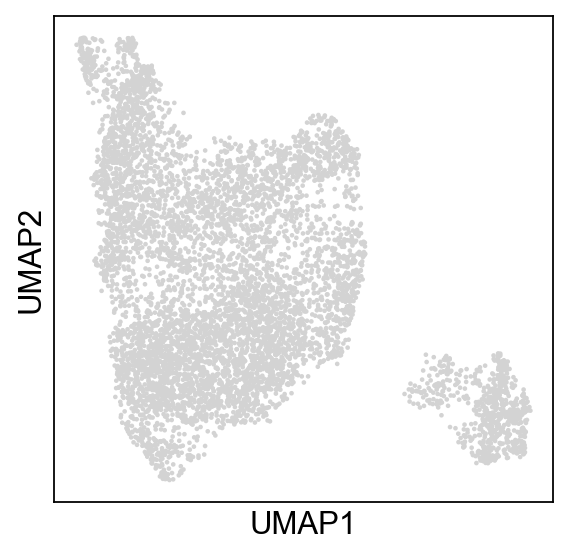

In [394]:
sc.pl.umap(prot, )

In [363]:
prot = mdata.mod['prot']
prot


AnnData object with n_obs × n_vars = 6918 × 137
    obs: 'unmapped', 'barcode_sequence', '-1', 'barcode', 'n_antibodies_by_counts', 'log1p_n_antibodies_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_5_antibodies', 'pct_counts_in_top_10_antibodies', 'pct_counts_in_top_15_antibodies', 'total_counts_control', 'log1p_total_counts_control', 'pct_counts_control', 'prot_leiden_0.2', 'prot_leiden_0.4', 'prot_leiden_0.6', 'prot_leiden_0.8', 'prot_leiden_1.0', 'cell_type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'n_counts'
    var: 'feature_name', 'control', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'neighbors', 'leiden', 'pca', 'umap', 'prot_leiden_0.2_colors', 'rank_genes_groups', 'cell_type_colors', 'dendrogram_cell_type'
    obsm: 'X_pca', 'X_umap', 'X_umap_rna'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities', 'protein_connectivities'

In [364]:
rna = mdata.mod['rna']
rna


AnnData object with n_obs × n_vars = 6918 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb'
    uns: 'log1p'
    layers: 'norm_counts', 'Norm-log data'

In [365]:
tcr= mdata.mod['TCR']
tcr

AnnData object with n_obs × n_vars = 6918 × 0
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'rece

In [ ]:
mdata = mu.MuData({"rna": adata, 'prot':prot}, )



In [ ]:
rna2=rna

In [ ]:
copied_obs

In [ ]:
sc.pl.umap(rna)

In [ ]:
rna2

In [ ]:
mdata.mod['rna'].obs['IR_VDJ_1_d_call']

In [ ]:
mu.pl.embedding(mdata, basis="rna:X_umap", color=['anti-human GPR56'])


In [ ]:
rna

In [ ]:
prot.var_names

In [366]:
tcr.obs['IR_VJ_1_c_call']

cell_id
AAACCTGAGAGATGAG-1    TRAC
AAACCTGAGAGTTGGC-1    TRAC
AAACCTGAGCTTTGGT-1     NaN
AAACCTGAGGTCGGAT-1    TRAC
AAACCTGAGTGCCATT-1    TRAC
                      ... 
TTTGTCAGTTAAAGTG-1    TRAC
TTTGTCATCCTAGAAC-1    TRAC
TTTGTCATCCTCAACC-1    TRAC
TTTGTCATCTATCCTA-1    TRAC
TTTGTCATCTTTCCTC-1    TRAC
Name: IR_VJ_1_c_call, Length: 6918, dtype: category
Categories (1, object): ['TRAC']

In [367]:
adata_tcr.obs['receptor_subtype']

cell_id
AAACCTGAGAGATGAG-1    TRA+TRB
AAACCTGAGAGTTGGC-1    TRA+TRB
AAACCTGAGCTTTGGT-1    TRA+TRB
AAACCTGAGGTCGGAT-1    TRA+TRB
AAACCTGAGTGCCATT-1    TRA+TRB
                       ...   
TTTGTCAGTTAAAGTG-1    TRA+TRB
TTTGTCATCCTAGAAC-1    TRA+TRB
TTTGTCATCCTCAACC-1    TRA+TRB
TTTGTCATCTATCCTA-1    TRA+TRB
TTTGTCATCTTTCCTC-1    TRA+TRB
Name: receptor_subtype, Length: 6918, dtype: object

In [368]:
rna

AnnData object with n_obs × n_vars = 6918 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb'
    uns: 'log1p'
    layers: 'norm_counts', 'Norm-log data'

In [369]:
listofcells=rna.obs_names

In [370]:
listofcells

Index(['AAACCTGAGAGATGAG-1', 'AAACCTGAGAGTTGGC-1', 'AAACCTGAGCTTTGGT-1',
       'AAACCTGAGGTCGGAT-1', 'AAACCTGAGTGCCATT-1', 'AAACCTGAGTGGTAAT-1',
       'AAACCTGCACAAGTAA-1', 'AAACCTGCACACGCTG-1', 'AAACCTGCACCAGGTC-1',
       'AAACCTGCAGCTGCTG-1',
       ...
       'TTTGTCAAGGGATGGG-1', 'TTTGTCAAGTTTGCGT-1', 'TTTGTCACATACAGCT-1',
       'TTTGTCAGTAGCTTGT-1', 'TTTGTCAGTGATAAAC-1', 'TTTGTCAGTTAAAGTG-1',
       'TTTGTCATCCTAGAAC-1', 'TTTGTCATCCTCAACC-1', 'TTTGTCATCTATCCTA-1',
       'TTTGTCATCTTTCCTC-1'],
      dtype='object', length=6918)

In [371]:
mu.pp.filter_obs(adata_tcr, listofcells)


In [372]:
listofcellstcr=adata_tcr.obs_names

In [373]:
mu.pp.filter_obs(rna, listofcellstcr)


In [374]:
adata_tcr

AnnData object with n_obs × n_vars = 6918 × 0
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'rece

In [375]:
rna.obs_names = adata_tcr.obs.copy()


/Users/xleana/anaconda3/envs/scRNAseq_2024/lib/python3.8/site-packages/anndata/_core/anndata.py:864: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [('True', 'True', 'False', '[]', 'TRAC', nan, 'TRBC1', nan, 517.0, nan, 7293.0, nan, nan, nan, nan, nan, 1.0, nan, 25.0, nan, 'TRAJ53', nan, 'TRBJ1-6', nan, 'TGCATCGTCGCTAGTGGAGGTAGCAACTATAAACTGACATTT', nan, 'TGTGCCAGCAGTTACGTTGCTCAGGGGTTTAATTCACCCCTCCACTTT', nan, 'CIVASGGSNYKLTF', nan, 'CASSYVAQGFNSPLHF', nan, 'TRA', nan, 'TRB', nan, 'True', 'None', 'True', 'None', 'TRAV26-1', nan, 'TRBV6-6', nan, 'True', 'TCR', 'TRA+TRB', 'single pair'), ('True', 'True', 'False', '[]', 'TRAC', nan, 'TRBC1', nan, 400.0, nan, 2451.0, nan, nan, nan, nan, nan, 2.0, nan, 7.0, nan, 'TRAJ22', nan, 'TRBJ1-1', nan, 'TGTGCTACGGACTCGCCTTCTGGTTCTGCAAGGCAACTGACCTTT', nan, 'TGTGCCAGCAGTTTTCGGCCGCGGAGCACTGAAGCTTTCTTT', nan, 'CATDSPSGSARQLTF', nan, 'CASSFRPRSTEAFF', nan, 'TRA', nan, 'TRB', nan, 'True', 'None', 'True', 'None', 'TRAV1

In [395]:
adata_tcr

AnnData object with n_obs × n_vars = 6918 × 0
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'rece

In [377]:
rna

AnnData object with n_obs × n_vars = 6918 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb'
    uns: 'log1p'
    layers: 'norm_counts', 'Norm-log data'

In [378]:
adata_tcr

AnnData object with n_obs × n_vars = 6918 × 0
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'rece

In [379]:
sc.pl.umap(rna)

KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [ ]:
import scanpy as sc
import scirpy as ir

import pandas as pd

In [ ]:
sc.write(adata=adata_tcr, filename="/Users/xleana/Desktop/Human_Thymus/CR-vdj-results/TCR_01_preprocessed.h5ad")

In [ ]:
adata_tcr= sc.read("/Users/xleana/Desktop/Human_Thymus/CR-vdj-results/TCR_01_preprocessed.h5ad")

In [380]:
adata_tcr

AnnData object with n_obs × n_vars = 6918 × 0
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'rece

In [382]:
rna

AnnData object with n_obs × n_vars = 6918 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb'
    uns: 'log1p'
    layers: 'norm_counts', 'Norm-log data'

In [381]:
sc.pl.umap(adata_tcr)

KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [385]:
rna.obs=adata_tcr.obs.copy()

In [386]:
rna

AnnData object with n_obs × n_vars = 6918 × 36601
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', '

In [387]:
adata_tcr

AnnData object with n_obs × n_vars = 6918 × 0
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', 'rece

In [388]:
rna

AnnData object with n_obs × n_vars = 6918 × 36601
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'receptor_type', '

In [396]:
for resolution_parameter in [0.1,0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0]:
    sc.tl.leiden(rna, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

KeyError: 'No "neighbors" in .uns'

In [ ]:
sc.pl.umap(rna,color=["CCR7","S1PR1"])

In [389]:
# adata[adata.obs['Status'] == 'Healthy'].obs['patient_id']
_ = ir.pl.group_abundance(
    rna,
    groupby="leiden_0.1",
    target_col="chain_pairing",
    normalize=True,
    figsize=[10, 10],
)

KeyError: 'leiden_0.1'

In [390]:
ir.pp.ir_dist(rna, sequence="aa")


In [391]:
ir.tl.define_clonotype_clusters(
    rna, sequence="aa", receptor_arms="all", dual_ir="primary_only"
)

  0%|          | 0/6880 [00:00<?, ?it/s]

In [392]:
ir.tl.clonotype_network(rna, min_cells=3, sequence="aa")


ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not 'leiden_0.1'

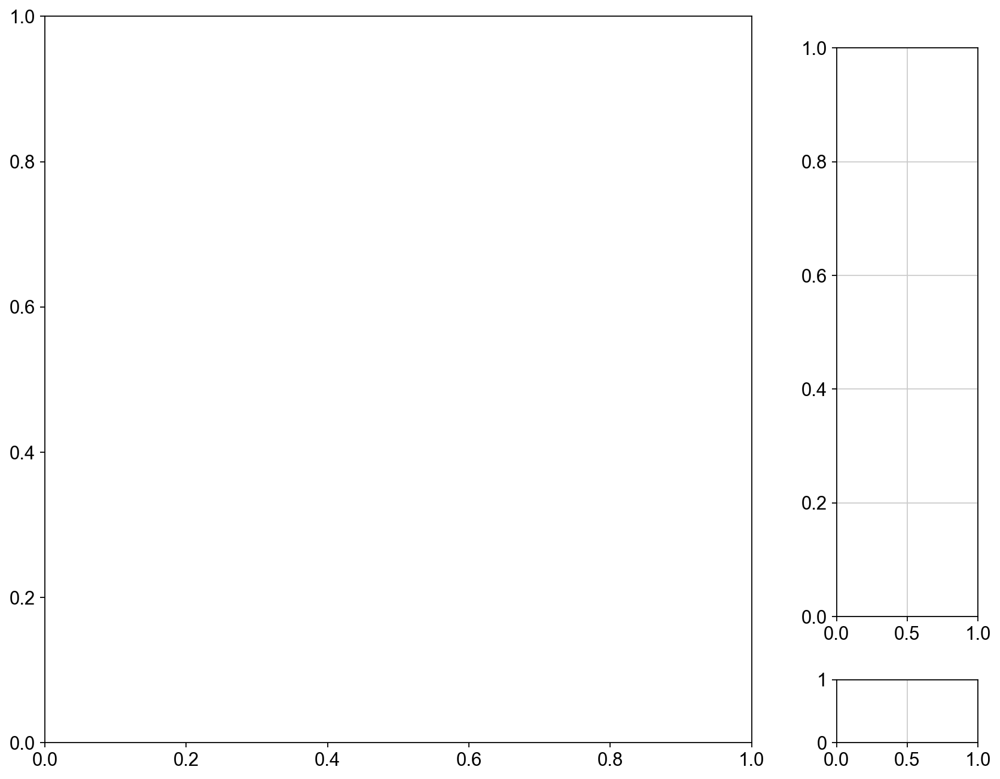

In [393]:
_ = ir.pl.clonotype_network(
    rna,
    color="leiden_0.1",
    base_size=200,
    label_fontsize=20,
    panel_size=(10, 10),
    legend_fontsize=15,
)

In [ ]:
rna.obs["cc_aa_identity"] = rna.obs["cc_aa_identity"].astype("str")


In [ ]:
rna.obs["IR_VDJ_1_junction_aa"]

In [ ]:
rna.obs["IR_VJ_1_junction_aa"]

In [ ]:
rna.obs["receptor_subtype"]

In [ ]:
rna.obs.loc[rna.obs["cc_aa_identity"] == "0", :].groupby(
    [
        "IR_VJ_1_junction_aa",
        "IR_VDJ_1_junction_aa",
        "receptor_subtype",
    ],
    observed=True,
).size().reset_index(name="n_cells")

In [ ]:
ir.tl.clonal_expansion(rna, target_col="cc_aa_identity")

_ = ir.pl.clonal_expansion(
    rna,
    groupby="leiden_0.1",
    target_col="cc_aa_identity",
    clip_at=4,
    normalize=False,
    figsize=[10, 10],
)


In [ ]:
sc.pl.umap(rna, color="has_ir")

In [ ]:
rna.obs["cc_aa_identity"]

In [ ]:
_ = ir.pl.clonal_expansion(
    rna, "leiden_0.1", target_col="cc_aa_identity", figsize=[10, 10]
)

In [ ]:
_ = ir.pl.alpha_diversity(
    rna, groupby="leiden_0.1", target_col="cc_aa_identity", figsize=[10, 10]
)

In [ ]:
_ = ir.pl.group_abundance(
    rna,
    groupby="cc_aa_identity",
    target_col="leiden_0.1",
    max_cols=10,
    figsize=[10, 10],
)

In [ ]:
_ = ir.pl.group_abundance(
    rna,
    groupby="IR_VJ_1_v_call",
    target_col="leiden_0.1",
    normalize=False,
    max_cols=10,
    figsize=[10, 10],
)

# Normalized abundances

_ = ir.pl.group_abundance(
    rna,
    groupby="IR_VJ_1_v_call",
    target_col="leiden_0.1",
    normalize=True,
    max_cols=10,
    figsize=[10, 10],
)

In [ ]:
_ = ir.pl.group_abundance(
    rna,
    groupby="IR_VDJ_1_v_call",
    target_col="leiden_0.1",
    normalize=False,
    max_cols=10,
    figsize=[10, 10],
)

# Normalized abundances

_ = ir.pl.group_abundance(
    rna,
    groupby="IR_VDJ_1_v_call",
    target_col="leiden_0.1",
    normalize=True,
    max_cols=10,
    figsize=[10, 10], 
)

In [ ]:
rna.obs.iloc[:, 31:45]


In [ ]:
_ = ir.pl.group_abundance(
    rna[
        rna.obs["IR_VDJ_1_v_call"].isin(
            ["TRAV26-1", "TRBV13-1", "TRBV9-2", "TRBV7-9"]
        ),
        :,
    ],
    groupby="leiden_0.1",
    target_col="IR_VDJ_1_v_call",
    normalize=True,
    figsize=[10, 10],
)

In [ ]:
_ = ir.pl.vdj_usage(
    rna,
    full_combination=False,
    max_segments=None,
    max_ribbons=30,
    fig_kws={"figsize": [10, 10]},
)

In [ ]:
_ = ir.pl.spectratype(
    rna,
    cdr3_col="IR_VDJ_1_junction_aa",
    color="leiden_0.1",
    viztype="bar",
    fig_kws={"dpi": 100},
    figsize=[10, 10],
)

In [ ]:
_ = ir.pl.spectratype(
    rna,
    cdr3_col="IR_VDJ_1_junction_aa",
    color="leiden_0.1",
    viztype="curve",
    curve_layout="shifted",
    fig_kws={"figsize": [10, 10]},
    kde_kws={"kde_norm": False},
)

In [ ]:
_ = ir.pl.spectratype(
    rna[
        rna.obs["IR_VDJ_1_v_call"].isin(
            ["TRBV5-1", "TRBV11-2", "TRBV7-2", "TRBV11-3"]
        ),
        :,
    ],
    cdr3_col="IR_VDJ_1_junction_aa",
    color="IR_VDJ_1_v_call",
    normalize="leiden_0.1",
    fig_kws={"dpi": 120},
    figsize=[10, 10],
)

In [ ]:
sc.pl.umap(rna, color=["FOXP3","CCR7"])

In [ ]:
motif = compute_motif(
    rna[
        (
            rna.obs["IR_VDJ_1_v_call"].isin(
                ["TRBV20-1", "TRBV5-1",'TRBV28']
            )
        )
        & (rna.obs["IR_VDJ_1_junction_aa"].str.len() == 15),
        :,
    ]
    .obs["IR_VDJ_1_junction_aa"]
    .to_list()
)

In [ ]:
motif

In [ ]:
motif2 = compute_motif(
    rna[
        (
            rna.obs["IR_VDJ_1_v_call"].isin(
                ["TRBV20-1"]
            )
        )
        & (rna.obs["IR_VDJ_1_junction_aa"].str.len() == 15),
        :,
    ]
    .obs["IR_VDJ_1_junction_aa"]
    .to_list()
)

In [ ]:
_ = svg_logo(
    motif, "/Users/xleana/Desktop/Human_Thymus/logo_motif.svg", color_scheme="taylor"
)

In [ ]:
_ = ir.pl.spectratype(
    rna,
    cdr3_col="IR_VDJ_1_junction_aa",
    color="leiden_0.1",
    viztype="curve",
    curve_layout="shifted",
    fig_kws={"figsize": [10, 10]},
    kde_kws={"kde_norm": False},
)

In [306]:
import sys
!{sys.executable} -m pip install matplotlib -U



In [253]:
import warnings

warnings.filterwarnings(
    "ignore",
    ".*IProgress not found*",
)
warnings.simplefilter(action="ignore", category=FutureWarning)

from palmotif import compute_motif, svg_logo
import scanpy as sc
import dandelion as ddl
import scirpy as ir
import pandas as pd
import numpy as np
import seaborn as sb

import os

import matplotlib as mpl
import matplotlib.pyplot as plt

warnings.simplefilter(action="ignore", category=pd.errors.DtypeWarning)

In [ ]:
rna.obs["IR_VDJ_1_junction_aa"]

In [ ]:
motif = compute_motif(
    rna[
        (
            rna.obs["IR_VDJ_1_v_call"].isin(
                ["TRBV20-1", "TRBV5-1"]
            )
        )
        & (rna.obs["IR_VDJ_1_junction_aa"].str.len() == 15),
        :,
    ]
    .obs["IR_VDJ_1_junction_aa"]
    .to_list()
)

In [ ]:
df, dst, lk = ir.tl.repertoire_overlap(
    rna, "leiden_0.1", target_col="cc_aa_identity", inplace=False
)

In [ ]:
df


In [ ]:
dst


In [ ]:
lk


In [ ]:
ir.pl.repertoire_overlap(
    rna, "leiden_0.1", target_col="cc_aa_identity"
)

In [ ]:
sc.pl.umap(rna, color="leiden_0.1")